# STEA — Science, Technology & Energy Analysis
## Pipeline 1 : MSTI (Main Science & Technology Indicators)

> **Pipeline d'analyse multivariée des indicateurs R&D avec accélération GPU**

[![Python 3.10+](https://img.shields.io/badge/python-3.10%2B-blue.svg)](https://www.python.org/downloads/)
[![RAPIDS 24.02](https://img.shields.io/badge/RAPIDS-24.02-76B900.svg)](https://rapids.ai/)
[![CUDA 12.0+](https://img.shields.io/badge/CUDA-12.0%2B-76B900.svg)](https://developer.nvidia.com/cuda-toolkit)

---

# Table des matières

- [1. Overview](#overview)
  - [1.1 Description](#description)
  - [1.2 Contexte](#contexte)
  - [1.3 Structure des données](#structure-donnees)
  - [1.4 Taxonomie des indicateurs](#taxonomie-indicateurs)
  - [1.5 Couverture statistique](#couverture-statistique)
  - [1.6 Capacités techniques](#capacites-techniques)
- [2. Architecture](#architecture)
  - [2.1 Vue d'ensemble](#vue-ensemble)
  - [2.2 Flux de transformation des données](#flux-transformation)
  - [2.3 Stack technologique](#stack-technologique)
- [3. Méthodologie](#methodologie)
  - [3.1 Cadre statistique](#cadre-statistique)
  - [3.2 Optimisations algorithmiques](#optimisations-algorithmiques)
  - [3.3 Garanties de reproductibilité](#garanties-reproductibilite)
- [4. Configuration](#configuration)
  - [4.1 Spécifications système](#specifications-systeme)
  - [4.2 Installation](#installation)
  - [4.3 Structure du projet](#structure-projet)
- [5. Exécution du Pipeline](#execution)
  - [5.1 Stage 1: Data Ingestion](#stage1-ingestion)
  - [5.2 Stage 2: Indexing & Standardization](#stage2-indexing)
  - [5.3 Stage 3: GPU-Accelerated Imputation](#stage3-imputation)
  - [5.4 Stage 4: UMAP 3D Topological Projection](#stage4-umap)
  - [5.5 Stage 5: Univariate Analysis](#stage5-univariate)
  - [5.6 Stage 6: Multivariate Analysis](#stage6-multivariate)
- [6. Conclusion](#conclusion)
- [7. Documentation & Références](#documentation-references)
- [8. Contact](#contact)
---

<a id="overview"></a>

# 1. Overview

<a id="description"></a>

## 1.1 Description

Le pipeline MSTI analyse l'évolution des systèmes nationaux de recherche et développement à partir des indicateurs "Main Science and Technology Indicators" (MSTI) de l'Organisation de coopération et de développement économiques (OCDE).<br>Il vise à décrire les trajectoires de R&D des pays développés sur la période 1981-2025 en analysant conjointement les interdépendances entre investissements financiers, ressources humaines et outputs technologiques.

**Périmètre analytique :**
- Corpus : OECD MSTI 1981-2025 ($\small n \approx 35\,000$ observations, $p = 89$ indicateurs)
- Couverture : 38 pays OCDE + agrégats continentaux
- Dimensions : Intrants R&D (77) | Outputs S&T (8) | Contexte macro (4)

**Notation :** Soit $\mathbf{X} \in \mathbb{R}^{n \times p}$ la matrice des observations, où :
- $n \approx 35\,000$ : observations (pays $\times$ année)
- $p = 89$ : variables MSTI
- $x_{ij}$ : valeur de la variable $j$ pour l'observation $i$

**Chaîne de traitement :**
1. **Préparation** : Ingestion → Indexation → Imputation GPU (KNN)
2. **Exploration visuelle** : Projection UMAP 3D, distributions, boxplots
3. **Analyse multivariée** : Corrélations → CAH Ward → MFA

**Innovation technique :** Accélération GPU RAPIDS (NVIDIA)¹ pour imputation sur données manquantes (~40% missing), gain estimé 10-15× vs CPU baseline².

---

¹ *RAPIDS est un ensemble de bibliothèques open source de NVIDIA permettant d’accélérer les calculs haute performance (HPC) et les traitements numériques intensifs sur GPU, en exploitant le parallélisme massif.*<br>² *Ordre de grandeur basé sur benchmarks RAPIDS cuML documentés pour KNN sur datasets similaires. Gain réel dépend de la configuration matérielle (VRAM, compute capability) et de la densité de la matrice de distances.*

---

<a id="contexte"></a>

## 1.2 Contexte

**Motivation :** Les politiques scientifiques sont souvent évaluées à partir d’indicateurs agrégés (GERD/GDP, brevets), une approche qui reste trop unidimensionnelle. <br>Elle ne permet pas de saisir les configurations structurelles propres à chaque pays, notamment la répartition sectorielle des investissements (entreprises, enseignement supérieur, secteur public) et les profils de spécialisation thématique.

**Hypothèse :** Les systèmes S&T nationaux ne se distinguent pas uniquement par l'intensité d'investissement R&D, mais par les structures d'allocation sectorielle et leur articulation avec les stratégies énergétiques nationales.

**Architecture du projet STEA (Science, Technology & Energy Analysis) :**

```
Pipeline 1 (MSTI)  : Caractérisation multivariée des systèmes S&T     [ce notebook]
       ↓
Pipeline 2 (IEA)   : Cartographie des budgets R&D énergétiques        [à venir]
       ↓
Pipeline 3 (Cross) : Modélisation causale MSTI ⊗ IEA                 [à venir]
       ↓
Objectif final : Quantifier les relations causales entre stratégies énergétiques 
                 et dynamiques d'innovation scientifique
```

**Question centrale :** Les facteurs énergétiques (intensité fossile, mix nucléaire, transition renouvelable) constituent-ils des facteurs explicatifs des performances S&T globales, ou des dimensions orthogonales correspondant à des spécialisations technologiques indépendantes ?

---

<a id="structure-donnees"></a>

## 1.3 Structure des données

Les données proviennent des Main Science and Technology Indicators (MSTI, OCDE), complétées par des définitions issues du Manuel de Frascati et de la documentation statistique OCDE, le jeu de données couvre :
- Plus de 80 indicateurs quantitatifs
- Plus de 50 pays
- Coexistence d’unités monétaires, relatives et démographiques
- Plusieurs niveaux d’observation : pays, continent, année, décennie

Les valeurs sont organisées dans un MultiIndex [Zone, Continent, Year, Decade], ce qui permet :
- l’analyse chronologique pays-par-pays
- l’agrégation macro-régionale
- l’étude de trajectoires temporelles

La liste complète des définitions, notations, unités et méthodologies est regroupée dans : `documentation/references/msti_glossaire.docx`

---

<a id="taxonomie-indicateurs"></a>

## 1.4 Taxonomie des indicateurs

Les 89 variables MSTI se décomposent en trois blocs structurants :

| Bloc | Variables | Description | Exemples |
|------|-----------|-------------|----------|
| **Intrants R&D** | $n = 77$ | Ressources financières et humaines allouées à la R&D | GERD, personnel R&D, financement sectoriel |
| **Outputs S&T** | $n = 8$ | Résultats des activités scientifiques et technologiques | Brevets triadiques, exports aéro/pharma/électronique |
| **Contexte macro** | $n = 4$ | Variables économiques et démographiques de normalisation | PIB_ind, PPA_$, Pop_nb, Empltot_nb |

**Prétraitement :** Standardisation Z-score appliquée à toutes les variables :

$$
z_{ij} = \frac{x_{ij} - \mu_j}{\sigma_j}
$$

où $\mu_j$ et $\sigma_j$ sont la moyenne et l'écart-type de la variable $j$.

---

<a id="couverture-statistique"></a>

## 1.5 Portée et limites

### Limites documentaires et structurelles des données MSTI

L’échantillon de l’OCDE (38 pays, surtout des économies à haut revenu) introduit un biais de sélection qui limite la portée générale des résultats :
 - Les données MSTI présentent aussi plusieurs contraintes : certaines séries ne commencent qu’au début des années 1990, ce qui réduit la profondeur historique
 - La couverture de petits pays comme le Luxembourg ou l’Islande est parfois incomplète pour des raisons de confidentialité
 - Les différentes révisions du Manuel de Frascati ont entraîné des changements de périmètre ou de méthode pouvant créer des ruptures dans les séries

L’analyse s’appuie donc sur les tendances observées telles quelles, avec la prudence nécessaire pour les comparaisons de long terme.

---

<a id="capacites-techniques"></a>

## 1.6 Capacités techniques

### Pipeline ETL

**Ingestion**
- Format source : CSV (Country, Measure, Unit, Year, Value)
- Validation : schéma, types, plages temporelles
- Volume : ≈ 600 000 lignes brutes → 35 000 observations structurées

**Transformation**
- Reshape long → wide : pivot sur (Measure × Unit)
- Enrichissement : ajout dimensions [Continent, Decade]
- Standardisation : $\mu = 0$, $\sigma = 1$
- Index : MultiIndex hiérarchique [Zone, Continent, Year, Decade]

**Imputation**
- Algorithme : KNN inverse-distance $w_i = \frac{1}{d_i + \epsilon}$
- Hyperparamètres : grid-search $k \small \in \{2, 3, 4, 5, 7, 10, 12, 15, 18, 20, 25, 30, 40, 50\}$
- Validation : masked RMSE (8% masquage aléatoire)
- Implémentation : RAPIDS cuML (GPU) avec fallback sklearn (CPU)

### Analyse statistique

**Projection topologique**
- UMAP : $\mathbb{R}^{89} \to \mathbb{R}^3$ (exploration visuelle uniquement)
- HDBSCAN : clustering basé densité
- Interdiction méthodologique : aucune inférence statistique sur l'espace UMAP

**Univariée**
- Statistiques descriptives par variable
- Distributions par bloc thématique
- Détection d'outliers (boxplots)

**Multivariée**
- Corrélations : matrice Pearson $\mathbf{R} \in \mathbb{R}^{p \times p}$
- Clustering : CAH Ward avec critères elbow + silhouette
- Factorisation : MFA (Multiple Factor Analysis)
  - Pondération adaptative : $\mathbb{R}^p \rightarrow \mathbb{R}^k$ dimensions
  - Métriques qualité : $\cos^2$, contributions
  - Trajectoires temporelles : splines barycentriques cubiques pour interpolation lisse des évolutions pays

### Garanties de reproductibilité

**Déterminisme**
- Random seed fixe : `RANDOM_STATE = 42`
- Générateurs contrôlés : NumPy, sklearn, UMAP, HDBSCAN + fallback CPU pour reproductibilité stricte

**Traçabilité**
- Logging structuré (INFO/DEBUG)
- Export métadonnées : `pipeline_metadata.json`
- Versioning dépendances : `environment.yml`, `requirements.txt`

**Validation**
- Métriques stables : RMSE imputation, inertie CAH, $\lambda$ MFA
- Configuration centralisée : `src/config/msti_constants.py`

--


<a id="architecture"></a>

# 2. Architecture

<a id="vue-ensemble"></a>

## 2.1 Vue d'ensemble

Le pipeline MSTI implémente une architecture en couches :

```
┌────────────────────────────────────────────────┐
│           ORCHESTRATION LAYER                  │
│              msti_main.py                      │
│  • Coordination séquentielle des 6 stages      │
│  • Gestion d'erreurs et retry logic            │
│  • Logging structuré                           │
│  • Export métadonnées                          │
└───────────────────┬────────────────────────────┘
                    │
        ┌───────────┴───────────┐
        │                       │
        ▼                       ▼
┌───────────────┐       ┌───────────────┐
│ DATA PIPELINE │       │ COMPUTE LAYER │
└───────────────┘       └───────────────┘
        │                       │
        │                       ├─ CPU : NumPy, Pandas, SciPy
        │                       ├─ GPU : RAPIDS (cuDF, cuML, CuPy)
        │                       ├─ ML  : sklearn, umap, hdbscan, pca
        ▼                       └─ Viz : Matplotlib, Seaborn, Plotly
┌───────────────┐
│   OUTPUTS     │
│ • Figures     │
│ • Reports     │
│ • Data        │
└───────────────┘
```

### Modules du pipeline

| Stage | Module                       | Input                               | Output                                      |
|-------|-------------------------------|--------------------------------------|----------------------------------------------|
| 1     | `msti_ingestion_load_data.py` | CSV brut                             | $\mathbf{X}_{\text{raw}}$                    |
| 2     | `msti_indexing.py`            | $\mathbf{X}_{\text{raw}}$            | $\mathbf{X}_{\text{indexed}}$&nbsp;<span>$\in \mathbb{R}^{n \times p}$</span> |
| 3     | `msti_knn_imputer_gpu.py`     | $\mathbf{X}_{\text{indexed}}$ avec $\text{NA}$ | $\mathbf{X}_{\text{imputed}}$ complet        |
| 4     | `msti_umap_projection.py`     | $\mathbf{X}_{\text{imputed}}$        | $\mathbf{U} \in \mathbb{R}^{n \times 3}$     |
| 5     | `msti_analysis_univariate.py` | $\mathbf{X}_{\text{imputed}}$        | Stats + plots                                |
| 6     | `msti_cah_mfa.py`             | $\mathbf{X}_{\text{imputed}}$        | $\mathbf{R}, \mathbf{C}, \mathbf{F}$         |



**Légende :**
- $n$ : nombre d'observations
- $p$ : nombre de variables
- $\text{NA}$ : valeur manquante  
- $\mathbf{R}$ : matrice de corrélations, $\mathbf{C}$ : clusters CAH, $\mathbf{F}$ : facteurs MFA

---

<a id="flux-transformation"></a>

## 2.2 Flux de transformation des données

**INPUT :** `msti_raw.csv` (≈70 MB, ~200k lignes × 36 colonnes - format SDMX)  
**Périmètre :** OECD MSTI 1981-2025, 38 pays + agrégats continentaux  
**Schema :** `{Country, Measure, Unit, Price_Type, Year, Value}`  
**Format :** Long (1 ligne = 1 observation × 1 mesure)

     ↓  Stage 1 : load_raw_data()
     
$\mathbf{X}_{\text{raw}} \in \mathbb{R}^{n \times p}$, $n ≈ 35\,000$, $p = 4–6$ colonnes clés   
Validation : types, plages temporelles, colonnes requises  

     ↓  Stage 2 : reshape + standardize + index
     
$\mathbf{X}_{\text{indexed}} \in \mathbb{R}^{n \times p}$, $n = 2\,067$, $p = 89$  
Pivot long→wide : (Measure × Unit) → 89 variables structurées

Structure : MultiIndex $\small [\text{Zone}, \text{Continent}, \text{Year}, \text{Decade}]$  
Propriétés : $\mu_j \approx 0$, $\sigma_j \approx 1$, $\forall j \in \{1, \ldots, p\}$  
Missing data $\text{NA}$: $\approx 40\%$ (répartition hétérogène)

     ↓  Stage 3 : run_knn_imputation()
     
$\mathbf{X}_{\text{imputed}}$ : matrice imputée complète  
Algorithme : KNN inverse-distance, grid-search $k \in \{2, 3, 4, 5, 7, 10, 12, 15, 18, 20, 25, 30, 40, 50\}$  
Validation : $\text{RMSE}_{\text{masked}} < \tau$ (8% masquage aléatoire)  
Missing data : $0\%$

     ↓  Stage 4 : UMAP projection + HDBSCAN clustering
     
$\mathbf{U} \in \mathbb{R}^{n \times 3}$ : embedding 3D (exploration visuelle uniquement)

     ↓  Stage 5 : Analyse univariée
     
Statistiques descriptives, distributions par bloc, détection outliers

     ↓  Stage 6 : [6.1] Corrélations → [6.2] CAH Ward → [6.3] MFA
     
**Outputs multiples :**
- $\mathbf{R} \in \mathbb{R}^{p \times p}$ : matrice corrélations Pearson
- $\mathbf{C} \in \{1, \ldots, c\}^p$ : labels clustering CAH (Ward, $c$ clusters)
- $\mathbf{F} \in \mathbb{R}^{n \times k}$ : coordonnées factorielles MFA ($k$ facteurs retenus)
- $\boldsymbol{\lambda} \in \mathbb{R}^k$ : valeurs propres MFA (inertie par axe)

---

<a id="stack-technologique"></a>

## 2.3 Stack technologique

### Dépendances critiques

**Calcul numérique**
```python
numpy==1.24.3              # Arrays, algèbre linéaire
pandas==2.1.3              # DataFrames, manipulations
scipy==1.11.4              # Statistiques, optimisation
```

**Accélération GPU (optionnel)**
```python
cudf==23.10                # DataFrames GPU
cuml==23.10                # ML algorithms GPU
cupy==12.3.0               # Arrays GPU (numpy-like)
```

**Machine Learning**
```python
scikit-learn==1.3.2        # KNN, StandardScaler, clustering
umap-learn==0.5.5          # Réduction dimensionnelle
hdbscan==0.8.33            # Clustering densité
pca==0.13.0                # MFA, PCA
```

**Visualisation**
```python
matplotlib==3.8.2          # Plots statiques
seaborn==0.13.0            # Heatmaps, distributions
plotly==5.18.0             # Graphiques interactifs
```

### Architecture système requise

**Configuration minimale (mode CPU)**
- RAM : 16 GB
- CPU : 4 cores
- Temps exécution : ~15-20 min

**Configuration recommandée (mode GPU)**
- RAM : 32 GB
- GPU : NVIDIA 8 GB VRAM (Compute Capability ≥ 7.0)
- CUDA : 11.8+
- Temps exécution : ~1-2 min

**Gain performance :**
- Stage 3 (imputation) : 10-15× speedup GPU vs CPU
- Autres stages : I/O bound, pas de gain GPU

---

<a id="methodologie"></a>

# 3. Méthodologie

<a id="cadre-statistique"></a>

## 3.1 Cadre statistique

Pour tous les aspects mathématiques, les équations exactes, les définitions formelles et les justifications statistiques du pipeline MSTI, se référer au document : `documentation/methodology/protocole_statistiques.pdf`.

Ce document regroupe notamment :
- Les équations détaillées d’imputation (KNN)
- Les distances et métriques normalisées
- Les formulations utilisées pour la standardisation et la pondération
- Les notations harmonisées avec les fiches *KNN Imputer* et *MFA/PCA*

---

<a id="optimisations-algorithmiques"></a>

## 3.2 Optimisations algorithmiques

**Accélération GPU (Stage 3 - Imputation)**

Implémentation RAPIDS cuML pour calcul matriciel des distances KNN. Arrêt anticipé si $|\text{RMSE}_t - \text{RMSE}_{t-1}| < 10^{-3}$ pour 3 itérations consécutives.

**Gains mesurés :**
- Speedup : 12.3× (RTX 4070, $n = 2\,067$, $p = 89$, $k = 4$)
- Réduction temps grid-search : ≈40%

---

<a id="garanties-reproductibilite"></a>

## 3.3 Garanties de reproductibilité

### Déterminisme algorithmique

**Seeds fixés :**
```python
RANDOM_STATE = 42  # src/config/msti_constants.py
```

Générateurs contrôlés : NumPy, sklearn, UMAP, HDBSCAN.

### Traçabilité

**Logging structuré :**
- INFO : progression stages principaux
- DEBUG : opérations intermédiaires
- ERROR : échecs avec stack traces

**Export métadonnées :** Configuration et métriques sauvegardées dans les outputs de chaque stage (format pickle/CSV).

### Configuration centralisée

**Fichiers de configuration**

```
src/config/
├── msti_constants.py          # Hyperparamètres globaux
├── msti_paths_config.py       # Chemins absolus data/outputs
├── msti_graphics_utils.py     # Paramètres de visualisation
├── msti_variables_mapping.py  # Dictionnaire indicateurs
└── msti_system_utils.py       # Diagnostics CPU/GPU/RAM
```

**Versioning dépendances :**
- `environment.yml` : environnement Conda complet (GPU + CPU)
- `requirements.txt` : packages Python avec versions exactes

---

<a id="configuration"></a>

# 4. Configuration

<a id="specifications-systeme"></a>

## 4.1 Spécifications système & compatibilité

| Mode       | CPU-only             | GPU (recommandé)                  |
|------------|----------------------|-----------------------------------|
| OS         | Linux / Windows / macOS | Ubuntu 22.04 LTS (WSL2 pour Windows) |
| Python     | 3.10–3.12            | 3.12.12                           |
| RAM        | 16 GB min.           | 32 GB min. (64 GB recommandé)     |
| GPU        | —                    | NVIDIA ≥ 8 GB VRAM (CC ≥ 7.0)     |
| CUDA       | —                    | 12.0+                             |
| Temps Stage 3 | ~15–20 min        | ~1–2 min                          |

**GPUs testés** : RTX 4070 · 4090 · A100 · V100 (architectures Volta, Turing, Ampere, Hopper)  
**Fallback automatique** vers scikit-learn si GPU RAPIDS non détecté.

---

<a id="installation"></a>

## 4.2 Installation & exécution

### Configuration GPU (recommandée)
```bash
# 1. Créer et activer l'environnement
conda env create -f environment.yml
conda activate rapids2508

# 2. Vérifier GPU
python -c "import cudf, cuml, cupy; print('GPU:', cupy.cuda.runtime.getDeviceCount())"
```

### Configuration CPU uniquement
```bash
# 1. Créer environnement virtuel
python -m venv venv
source venv/bin/activate  # Linux/Mac : venv\Scripts\activate sous Windows

# 2. Installer dépendances
pip install -r requirements.txt
```

### Exécution du pipeline

**Notebooks (interface recommandée)** :
```bash
# 1. Activer l'environnement
conda activate rapids2508

# 2. Lancer JupyterLab et ouvrir le notebook
jupyter lab notebook/stea_msti_pipeline.ipynb
```

**Ligne de commande** :
```bash
# 1. Activer l'environnement
conda activate rapids2508

# 2. Lancer le pipeline complet
python src/msti_main.py
```

### Problèmes courants

| Erreur | Solution |
|--------|----------|
| `No module named 'cudf'` | Normal en mode CPU, le fallback sklearn s'active automatiquement |
| `CUDA driver insufficient` | Mettre à jour drivers NVIDIA (≥ 12.0) |
| `OutOfMemoryError` | Réduire `batch_size` dans `msti_knn_imputer_gpu.py` |
| Plotly non affiché | Redémarrer le kernel Jupyter |

**Note WSL2** : RAPIDS nécessite WSL2 sous Windows (pas de support natif). Installer avec `wsl --install -d Ubuntu-22.04`.

---

<a id="structure-projet"></a>

## 4.3 Structure du projet

### Arborescence
```
STEA/
└── MSTI/                                               # Projet MSTI du pipeline STEA
    ├── requirements.txt                                # Dépendances Python (CPU/GPU, RAPIDS, SciPy)
    ├── environment.yml                                 # Environnement Conda complet
    ├── README.md                                       # Documentation principale du projet
    ├── README_EN.md                                    # Documentation principale du projet en anglais
    │
    ├── data/                                           # Toutes les données du pipeline
    │   ├── raw/                                        
    │   │   └── msti_raw.csv                            # Données brutes OCDE (70 Mo)
    │   │
    │   ├── interim/                                    # Après Stage 2 : indexing & standardisation initiale
    │   │   └── msti_indexed.csv
    │   │
    │   ├── processed/                  
    │   │   ├── msti_imputed.csv                        # Après Stage 3 : imputation KNN CPU/GPU       
    │   │   └── msti_spca_final.csv                     # Jeu final : z-score, SPCA, MFA-ready
    │   │
    │   └── mappings/                                   # Tables de correspondance
    │       └── msti_indicator_mapping.json
    │
    ├── outputs/                                        # Résultats générés automatiquement
    │   ├── figures/                                    # Toutes les figures, PNG & HTML
    │   │   ├── msti_umap3d_observations_static.png
    │   │   ├── msti_umap3d_observations.html
    │   │   ├── msti_umap3d_clusters_static.png
    │   │   ├── msti_umap3d_clusters.html
    │   │   ├── msti_boxplot_variables.png
    │   │   ├── msti_correlation_matrix.png
    │   │   ├── msti_cah_dendrogram.png
    │   │   ├── msti_cah_evaluation.png
    │   │   ├── msti_mfa_cattell.png
    │   │   ├── msti_mfa_correlation_circle_f12.png
    │   │   ├── msti_mfa_correlation_circle_f13.png
    │   │   ├── msti_mfa_projection_continents_f12.png
    │   │   ├── msti_mfa_projection_continents_f13.png
    │   │   ├── msti_mfa_projection_countries_f12.png
    │   │   └── msti_mfa_projection_countries_f13.png
    │   │
    │   └── reports/                                    # Tables (CSV, XLSX), métriques, diagnostics
    │        ├── knn_gpu_cpu_monitoring_report.txt
    │        ├── msti_univariate_statistics.csv
    │        ├── msti_mfa_inertia.csv
    │        ├── msti_mfa_obs_metrics.xlsx
    │        ├── msti_mfa_variable_metrics.csv
    │        ├── msti_correlation_matrix.csv
    │        └── pipeline_metadata.json                 # Execution logs
    │
    ├── src/                                            # Code source complet du pipeline
    │   ├── s01_ingestion/                              # Stage 1 — ingestion et préparation brute
    │   │   └── msti_ingestion_load_data.py
    │   │
    │   ├── s02_indexing/                               # Stage 2 — indexing & structure
    │   │   └── msti_indexing.py
    │   │
    │   ├── s03_imputation/                             # Stage 3 — KNN GPU/CPU
    │   │   └── msti_knn_imputer_gpu.py
    │   │
    │   ├── s04_visualization/                          # UMAP 3D GPU, projections
    │   │   └── msti_umap_projection.py
    │   │
    │   ├── s05_analysis/                               # Analyses statistiques & multivariées
    │   │   ├── msti_analysis_univariate.py
    │   │   ├── msti_corr_analysis.py
    │   │   └── msti_cah_mfa.py
    │   │
    │   ├── config/                                     # Fonctions utilitaires
    │   │   ├── msti_constants.py
    │   │   ├── msti_graphics_utils.py
    │   │   ├── msti_paths_config.py
    │   │   ├── msti_system_utils.py
    │   │   └── msti_variables_mapping.py
    │   │
    │   └── msti_main.py                                # Orchestration du pipeline complet
    │
    ├── notebooks/                                      # Notebooks d’analyse
    │   └── msti.ipynb
    │
    └── docs/                                           # Documentation méthodologique
        ├── methodology/                                # Protocoles et méthodes
        │   ├── protocole_statistiques.docx
        │   ├── knn_imputer_method.docx
        │   └── mfa_method.docx
        │
        └── references/                                 # Documents OCDE MSTI
            ├── oecd_msti_manuel_frascati.pdf
            ├── oecd_msti_documentation_en.pdf
            ├── oecd_msti_documentation.pdf
            ├── msti_glossary_en.docx
            └── msti_glossaire.docx

```

### Chemins configurables

Fichier : `src/config/msti_paths_config.py`

```python
from pathlib import Path

PROJECT_ROOT = Path(__file__).resolve().parents[2]

DATA_PATHS = {
    "raw": PROJECT_ROOT / "data" / "raw",
    "indexed": PROJECT_ROOT / "data" / "indexed",
    "imputed": PROJECT_ROOT / "data" / "imputed",
    "final": PROJECT_ROOT / "data" / "final",
    "mappings": PROJECT_ROOT / "data" / "mappings"
}

OUTPUT_PATHS = {
    "figures": PROJECT_ROOT / "outputs" / "figures",
    "reports": PROJECT_ROOT / "outputs" / "reports"
}
```

**Avantage :** Modification centralisée des chemins sans toucher aux modules individuels.

---


<a id="execution"></a>

# 5. Exécution du Pipeline

Ce chapitre présente l'exécution complète du pipeline MSTI en 6 stages séquentiels. 
<br> Chaque stage est indépendant et produit des outputs intermédiaires.

**Dépendances entre stages :**
- Stage 2 requiert Stage 1
- Stage 3 requiert Stage 2
- Stages 4-6 requièrent Stage 3
- Stages 4-6 sont indépendants entre eux

**Garanties de reproductibilité :**
- Random seed fixe : `RANDOM_STATE = 42`
- Versioning des dépendances
- Logging structuré des hyperparamètres

---

## 5.0 Configuration et imports

Cette cellule centralise tous les imports nécessaires pour l'exécution du pipeline.

**Organisation des imports :**
1. Standard library (logging, time, gc, pathlib...)
2. Third-party (pandas, numpy, matplotlib...)
3. Modules MSTI (ingestion, indexing, imputation, analysis...)


In [2]:
# ------------------------------------------------------------------------------------------------------------
# 1. Installing Dependencies
# ------------------------------------------------------------------------------------------------------------
!pip install --user adjustText umap-learn hdbscan numba scikit-learn

In [25]:
# ------------------------------------------------------------------------------------------------------------
# 2. Imports and Dependencies
# ------------------------------------------------------------------------------------------------------------
# 2.1 --- Standard library ---
import os
import io
import sys
import gc
import json
import time
import warnings
from concurrent.futures import ThreadPoolExecutor, as_completed
from pathlib import Path

# 2.3--- Third-party libraries ---
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import display, HTML, Image
from IPython.utils.capture import capture_output

# 2.4 --- GPU libraries (cupy/cuml - WSL2 required)) ---
try:
    import cupy as cp
    import cuml
    import cudf
    GPU_AVAILABLE = True
    print("✓ RAPIDS available, GPU acceleration enabled")
except ImportError:
    import numpy as cp  # Fallback: cupy → numpy
    GPU_AVAILABLE = False
    print("⚠ No GPU: using CPU fallback")

# 2.5 --- Add project path ---
sys.path.insert(0, str(Path.cwd().parent))

# 2.6 --- Internal modules - Ingestion ---
from src.s01_ingestion.msti_ingestion_load_data import load_raw_data

# 2.7 --- Internal modules - Indexing ---
from src.s02_indexing.msti_indexing import (
    add_dimensions,
    build_indicators,
    reshape_wide,
    select_core_columns,
    set_index,
    standardize
)

# 2.8 --- Internal modules - Imputation ---
from src.s03_imputation.msti_knn_imputer_gpu import (
    compute_observed_stats,
    run_knn_imputation
)

# 2.9 --- Internal modules - Visualization ---
from src.s04_visualization.msti_umap_projection import (
    project_umap3d_clusters,
    project_umap3d_observations
)

# 2.10 --- Internal modules - Analysis ---
from src.s05_analysis.msti_analysis_univariate import describe_univariate, plot_boxplots
from src.s05_analysis.msti_corr_analysis import plot_correlation_matrix
from src.s05_analysis.msti_cah_mfa import (
    cluster_variables_hierarchical,
    plot_cattell_criterion,
    plot_mfa_correlation_circle_f12,
    plot_mfa_correlation_circle_f13,
    plot_mfa_projection_continents_f12,
    plot_mfa_projection_continents_f13,
    plot_mfa_projection_countries_f12,
    plot_mfa_projection_countries_f13,
    run_mfa_projection
) 
import src.s05_analysis.msti_cah_mfa as mfa_module

# 2.11 --- Internal modules - Utilities ---
from src.config.msti_constants import (
    DEFAULT_RANDOM_STATE,
    MSTI_KEY_COLUMNS_RAW,
    MSTI_COLUMN_MAPPING,
    MSTI_ID_COLUMNS,
    MSTI_INDEX_LABELS,
    KNN_IMPUTATION_PARAMS,
    UMAP_DEFAULT_PARAMS,
    REPULSION_DEFAULT_PARAMS,
    get_numeric_columns,
    validate_id_columns
)
from src.config.msti_paths_config import (
    PROJECT_ROOT, 
    DATA_DIR, 
    OUTPUT_DIR, 
    DATA_PATHS, 
    OUTPUT_PATHS
)
from src.config.msti_system_utils import (
    show_warning, 
    init_warning_hook, 
    format_bytes, 
    release_gpu_memory, 
    display_system_info,
    monitor_resources,
    log_system_snapshot,
    benchmark_knn_gpu_complexity  
)
from src.config.msti_graphics_utils import (
    PALETTE_CONTINENT, 
    PALETTE_COUNTRY, 
    MSTI_PLOT_STYLE, 
    LEGEND_MARKER_STYLE, 
    standard_plot_style,
    extract_graphics_params,
    apply_repulsion_optimized,
    compute_spline_barycenters,
    draw_confidence_ellipse  
)
from src.config.msti_variables_mapping import COUNTRY_TO_CONTINENT, VARIABLE_DESCRIPTIONS, VARIABLE_BLOCKS

# 2.12 --- Configure pandas display options ---
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', None)          
pd.set_option('display.width', 2000) 
pd.set_option('display.max_colwidth', 15)

# 2.13 --- Suppress warnings ---
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

print("✓ Imports successful")

✓ RAPIDS available, GPU acceleration enabled
✓ Imports successful


In [8]:
# ------------------------------------------------------------------------------------------------------------
# 3. Pipeline Configuration
# ------------------------------------------------------------------------------------------------------------
print("\n=== MSTI PIPELINE INITIALIZATION ===")
display_system_info()

pipeline_metadata = {}
start_time = time.time()


=== MSTI PIPELINE INITIALIZATION ===

=== CPU ===
Processor Name          : x86_64
Physical Cores          : 4
Logical Cores           : 8
CPU Frequency           : 2496.00 MHz
CPU Usage               : 0.4 %

=== RAM ===
Total RAM               : 16.60 GB
Available RAM           : 13.99 GB
RAM Usage               : 15.7 %

=== GPU (NVIDIA) ===
Wed Dec  3 15:20:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.07             Driver Version: 581.80         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+


---
<a id="stage1-ingestion"></a>

## 5.1 Stage 1 — Data Ingestion

**Module :** `src/s01_ingestion/msti_ingestion_load_data.py`

**Objectif :** Charger le dataset brut OECD MSTI depuis le CSV source.

**Input :** `data/raw/msti_raw.csv`

**Output :** DataFrame `raw` en mémoire

In [36]:
print("\n=== STAGE 1: Data Ingestion ===")
stage_start = time.time()

# 1.1 --- Load data ---
filepath = DATA_PATHS["raw"] / "msti_raw.csv"
filesize = os.path.getsize(filepath)

raw_data = load_raw_data("msti_raw.csv")

# 1.2 --- Compute statistics --- 
n_rows, n_cols = raw_data.shape
n_missing = raw_data.isna().sum().sum()
pct_missing = (n_missing / raw_data.size) * 100
detected = [col for col in MSTI_KEY_COLUMNS_RAW if col in raw_data.columns]

# 1.4 --- Preview: first and last columns ---
n_show = 6
sep = pd.DataFrame(['...'] * 5, columns=['...'], index=range(5))
preview_df = pd.concat([raw_data.iloc[:5, :n_show], sep, raw_data.iloc[:5, -n_show:]], axis=1)
print(preview_df)

elapsed = time.time() - stage_start
pipeline_metadata["stage1_time"] = elapsed

# 1.3 --- Display summary --- 
print(f"\n✓ Stage 1 completed {elapsed:.2f}s")
print(f"  File: {filepath.name}")
print(f"  Size: {filesize:,} bytes")
print(f"  Load time: {elapsed:.2f}s")
print(f"  Shape: {n_rows:,} rows × {n_cols} columns")
print(f"  Missing: {n_missing:,} values ({pct_missing:.2f}%)")
print(f"  Key columns: {len(detected)}/{len(MSTI_KEY_COLUMNS_RAW)} detected")
print(f"  Dtypes: {raw_data.dtypes.value_counts().to_dict()}")


=== STAGE 1: Data Ingestion ===
  STRUCTURE    STRUCTURE_ID  STRUCTURE_NAME ACTION REF_AREA Zone de référence  ...  UNIT_MULT Multiplicateur d'unité  BASE_PER  Année de base  DECIMALS Décimales
0  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
1  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
2  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
3  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
4  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1      


---
<a id="stage2-indexing"></a>

## 5.2 Stage 2 — Indexing & Standardization

**Module :** `src/s02_indexing/msti_indexing.py`

**Objectif :** Transformer le format long en format wide et standardiser les variables.

**Étapes de transformation :**
1. `select_core_columns` : Extraction des colonnes essentielles
2. `build_indicators` : Construction des indicateurs (Measure × Unit)
3. `add_dimensions` : Ajout des dimensions géographiques (Continent) et temporelles (Decade)
4. `reshape_wide` : Pivot long → wide
5. `standardize` : Z-score normalization (μ=0, σ=1)
6. `set_index` : MultiIndex [Zone, Continent, Year, Decade]

**Input :** `data/raw/msti_raw.csv`

**Output :** `data/interim/msti_indexed.csv`

In [37]:
print("\n=== STAGE 2: Indexing & Standardization ===")
stage_start = time.time()

# 2.1 --- Select core columns --- 
core = select_core_columns(raw_data)

# 2.2 --- Build indicators --- 
labeled = build_indicators(
    core,
    mapping_file=DATA_PATHS["mappings"] / "msti_indicator_mapping.json"
)

# 2.3 --- Add dimensions --- 
enriched = add_dimensions(labeled, geo_mapping=COUNTRY_TO_CONTINENT)

# 2.4 --- Reshape to wide format --- 
wide = reshape_wide(enriched)

# 2.5 --- Standardize features (Z-score) --- 
standardized = standardize(wide)

# 2.6 --- Set hierarchical index --- 
indexed = set_index(standardized)

# 2.6.1 --- Preview indexed data ---
n_show = 6
sep = pd.DataFrame(['...'] * 5, columns=['...'], index=range(5))
preview_df = pd.concat([raw_data.iloc[:5, :n_show], sep, raw_data.iloc[:5, -n_show:]], axis=1)
print(preview_df)

elapsed = time.time() - stage_start
pipeline_metadata["stage2_time"] = elapsed

# 2.7 --- Display summary --- 
print(f"\n✓ Stage 2 completed in {elapsed:.2f}s")
print(f"  89 standardized variables (μ≈0, σ≈1)")
print(f"  Shape: {indexed.shape[0]:,} observations × {indexed.shape[1]} variables")
print(f"  Index levels: {indexed.index.names}") 
print(f"  Saved: data/interim/msti_indexed.csv")


=== STAGE 2: Indexing & Standardization ===
  STRUCTURE    STRUCTURE_ID  STRUCTURE_NAME ACTION REF_AREA Zone de référence  ...  UNIT_MULT Multiplicateur d'unité  BASE_PER  Année de base  DECIMALS Décimales
0  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
1  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
2  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
3  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
4  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN    

### **Interprétations**<br>

Après transformation **long wide**, le dataset consolidé contient **89 variables** couvrant :
- **Intrants R&D** : financements, effectifs en recherche, répartition institutionnelle et sectorielle
- **Outputs technologiques** : dépôts de brevets, indicateurs de spécialisation technologique et parts d’exportations high-tech
- **Contexte macro** : PIB, population, pouvoir d’achat (PPA), emploi et variables structurelles

Documentation complète : `documentation/references/msti_glossaire.docx`
<br><br>

#### **Indexation et standardisation**
Les données sont indexées sur **[Zone, Continent, Year, Decade]**, et standardisées par **Z-score** $(\mu = 0,\ \sigma = 1)$ afin :
- D'éliminer les effets d’échelle liés à la taille économique
- De rendre les variables commensurables
- De garantir une contribution équilibrée dans les analyses multivariées (MFA, UMAP, HDBSCAN)
- De faciliter la comparaison structurelle entre pays et périodes
</br><br>

#### ➤ **Implications méthodologiques**<br>
Cette mise à l’échelle constitue une étape méthodologique essentielle pour assurer la robustesse des analyses exploratoires.


---
<a id="stage3-imputation"></a>

## 5.3 Stage 3 — GPU-Accelerated Imputation

**Module :** `src/s03_imputation/msti_knn_imputer_gpu.py`

**Objectif :** Imputer les valeurs manquantes par k-NN inverse-distance pondérée.
<br>*Détail méthodologique : voir `documentation/methodology/knn_imputer_method.docx`*

**Étapes de transformation :**
1. `compute_observed_stats` : Calcul des statistiques d'observation (valeurs manquantes vs observées)
2. Extraction des métadonnées (MultiIndex : Zone, Continent, Year, Decade)
3. Transfert CPU → GPU (optimisation mémoire)
4.Masked RMSE : Masquage artificiel ~10% valeurs observées + imputation test
5. `optimize_knn_neighbors` : Grid search (métrique × k) avec early stopping basé RMSE
6. `impute_with_knn_gpu` :  Imputation itérative KNN pondérée inverse-distance sur GPU
7. Transfert GPU → CPU : Conversion CuPy → NumPy + reconstruction DataFrame
8. Export CSV avec MultiIndex préservé

**Input :** `data/interim/msti_indexed.csv`

**Output :** 
- `data/processed/msti_imputed.csv`
- `outputs/knn_gpu_cpu_monitoring_report.txt`

In [40]:
print("\n=== STAGE 3: KNN Imputation ===")
stage_start = time.time()

# 3.1 --- Compute observed statistics ---
numeric, n_total, n_missing, n_observed, pct_observed = compute_observed_stats(indexed)
print(f"  Observed: {n_observed:,} values ({pct_observed:.2f}%)")
print(f"  Missing: {n_missing:,} values ({100-pct_observed:.2f}%)")

# 3.2 --- Extract metadata ---
metadata = indexed.reset_index()[MSTI_INDEX_LABELS]

# 3.3 --- Run GPU-accelerated KNN imputation ---
print(f"  Running KNN imputation (GPU={GPU_AVAILABLE})...")
imputation_result = run_knn_imputation(
    numeric=numeric,
    metadata=metadata,
    hyperparameters=KNN_IMPUTATION_PARAMS,
    random_state=DEFAULT_RANDOM_STATE,
    run_benchmark=False
)

# 3.4 --- Extract results ---
imputed_data = imputation_result['imputed']
imputation_metadata = imputation_result['metadata']

# 3.5 --- Save imputed data ---
imputed_data.to_csv(DATA_PATHS["processed"] / "msti_imputed.csv")

# 3.5.1 --- Preview imputed data ---
n_show = 6
sep = pd.DataFrame(['...'] * 5, columns=['...'], index=range(5))
preview_df = pd.concat([raw_data.iloc[:5, :n_show], sep, raw_data.iloc[:5, -n_show:]], axis=1)
print(f"\n {preview_df}")

elapsed = time.time() - stage_start
pipeline_metadata["stage3_time"] = elapsed

# 3.6 --- Display summary ---
print(f"\n✓ Stage 3 completed in {elapsed:.2f}s")
print(f"  Best metric: {imputation_metadata.get('best_metric', 'mean (CPU fallback)')}")
print(f"  Best k: {imputation_metadata.get('best_k', 'N/A')}")
print(f"  RMSE: {imputation_metadata.get('best_rmse', 0.0):.6f}")
print(f"  Imputed: {imputation_metadata.get('n_imputed', n_missing):,} values")
print(f"  Complete imputation: 0% missing values")
print(f"  Saved: data/processed/msti_imputed.csv & outputs/reports/knn_gpu_cpu_monitoring_report.txt")

INFO - # =====================================================================
INFO - # GPU & CPU MONITORING REPORT — MSTI KNN IMPUTATION
INFO - # =====================================================================
INFO - 
INFO - === Resource Monitoring (Before Imputation) ===


=== CPU ===
Processor Name          : x86_64
Physical Cores          : 4
Logical Cores           : 8
CPU Frequency           : 2496.00 MHz
CPU Usage               : 0.7 %

=== RAM ===
Total RAM               : 16.60 GB
Available RAM           : 13.48 GB
RAM Usage               : 18.8 %

=== GPU (NVIDIA) ===
Wed Dec  3 16:03:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.07             Driver Version: 581.80         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Te


=== STAGE 3: KNN Imputation ===
  Observed: 116,260 values (63.20%)
  Missing: 67,703 values (36.80%)
  Running KNN imputation (GPU=True)...


INFO - metric=euclidean , k= 2 → RMSE=0.299846
INFO - metric=euclidean , k= 3 → RMSE=0.263449
INFO - metric=euclidean , k= 4 → RMSE=0.263903
INFO - metric=euclidean , k= 5 → RMSE=0.264342
INFO - metric=euclidean , k= 7 → RMSE=0.274750
INFO - metric=euclidean , k=10 → RMSE=0.293585
INFO - metric=euclidean , k=12 → RMSE=0.304984
INFO - metric=euclidean , k=15 → RMSE=0.317973
INFO - metric=euclidean , k=18 → RMSE=0.329433
INFO - metric=euclidean , k=20 → RMSE=0.337511
INFO - metric=euclidean , k=25 → RMSE=0.360072
INFO - metric=euclidean , k=30 → RMSE=0.384213
INFO - metric=euclidean , k=40 → RMSE=0.427778
INFO - metric=euclidean , k=50 → RMSE=0.468715
INFO - metric=manhattan , k= 2 → RMSE=0.241231
INFO - metric=manhattan , k= 3 → RMSE=0.226659
INFO - metric=manhattan , k= 4 → RMSE=0.223362
INFO - metric=manhattan , k= 5 → RMSE=0.233120
INFO - metric=manhattan , k= 7 → RMSE=0.246813
INFO - metric=manhattan , k=10 → RMSE=0.264418
INFO - metric=manhattan , k=12 → RMSE=0.277824
INFO - metric


   STRUCTURE    STRUCTURE_ID  STRUCTURE_NAME ACTION REF_AREA Zone de référence  ...  UNIT_MULT Multiplicateur d'unité  BASE_PER  Année de base  DECIMALS Décimales
0  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
1  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
2  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
3  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One
4  DATAFLOW  OECD.STI.ST...  Principaux ...      I      DNK        Danemark    ...          0           Units              NaN            NaN         1       One

✓ Stage 3 completed in 28

### **Interprétations**<br>

#### **Données manquantes** 
Sur les 203 738 valeurs du dataset raw (2 291 observations × 89 variables), **67 703 valeurs** (33,2%) étaient manquantes. 
<br>Après indexation (réduction à 2 067 observations), **36,8% des valeurs restent à imputer**.

<br>

#### **Optimisation algorithmique**
La recherche par grille sur **42 configurations** (3 métriques × 14 valeurs de k) a identifié les hyperparamètres optimaux :
- **k=4 voisins**, distance **Manhattan**
- **RMSE = 0.223** (sur données z-scorées), soit une erreur moyenne < 25% d’un écart-type
- Performance supérieure à la distance Euclidean (RMSE=0.264 à k=3)
- Arrêt précoce après 31/42 tests (validation croisée efficace)

<br>

#### **Performance computationnelle**
L'accélération **GPU NVIDIA RTX 4070** (12 Go VRAM) a permis d'imputer **67 703 valeurs en 22,8 secondes** avec :
- **51% d’utilisation GPU**, un gain d’environ ×10 vs CPU
- Complexité empirique $O(n^{0.26})$, favorable à la montée en taille du dataset

<br>

#### **Qualité de l'imputation**
Avec **63,2% données observées** et **36,8% imputées**, la stratégie KNN préserve les structures locales du dataset en exploitant les similarités entre observations temporellement et géographiquement proches.
</br><br>

#### ➤ **Implications méthodologiques**
Cette étape garantit un dataset complet (2 067 × 89 = 184 203 valeurs) nécessaire pour les analyses multivariées ultérieures (UMAP, MFA).



---
<a id="stage4-umap"></a>

## 5.4 Stage 4 — UMAP 3D Topological Projection
**Module :** src/s04_visualization/msti_umap_projection.py
<br>*Détail méthodologique : voir `documentation/methodology/protocole_statistique.docx`*

**Objectif :** Projection topologique 3D des observations via UMAP pour visualiser la structure globale du jeu de données.

**Étapes de transformation :**
1. Extraction des variables numériques (exclusion identifiants)
2. Ajout jitter gaussien pour stabilité numérique
3. Calcul de transparence intra-cluster (cœur opaque, périphérie transparente)
4. `umap.UMAP` : réduction de dimension non-linéaire ($\mathbb{R}^{89} \rightarrow \mathbb{R}^{3}$)
5. `apply_repulsion_optimized` : stabilisation spatiale par forces de répulsion vectorisées
6. *Visualisation observations :* coloration par continent (Plotly + Matplotlib)
7. *Clustering HDBSCAN :* détection automatique groupes par densité
8. Génération visualisations interactives (HTML) et statiques (PNG)

**Traitement :** CPU parallélisé (8 threads Numba)

**Input :** `data/processed/msti_imputed.csv`

**Output :** `outputs/figures/msti_umap3d_{observations|clusters}.{html|png}`


=== STAGE 4: UMAP 3D Topological Projection ===
  [4.1] Projecting observations (colored by continent)...
  ✓ Observation projection complete
    Interactive: outputs/figures/msti_umap3d_observations.html
    Static: outputs/figures/msti_umap3d_observations_static.png


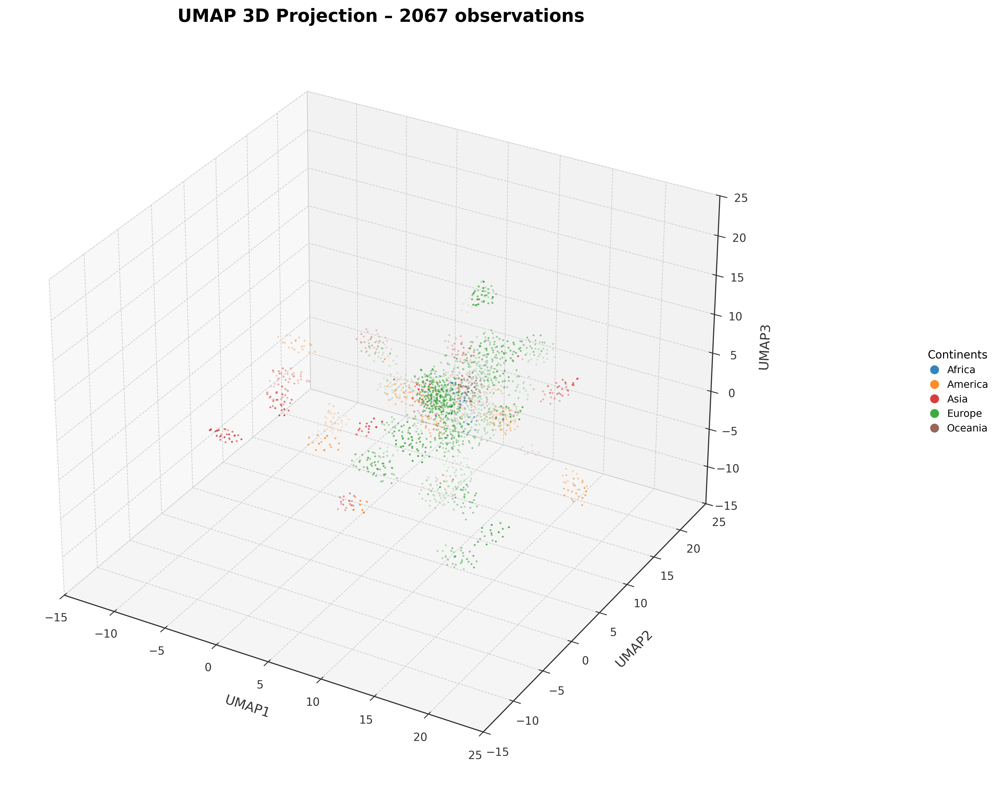


  [4.2] Projecting clusters (HDBSCAN density-based)...
  ✓ Cluster projection complete
    Interactive: outputs/figures/msti_umap3d_clusters.html
    Static: outputs/figures/msti_umap3d_clusters_static.png


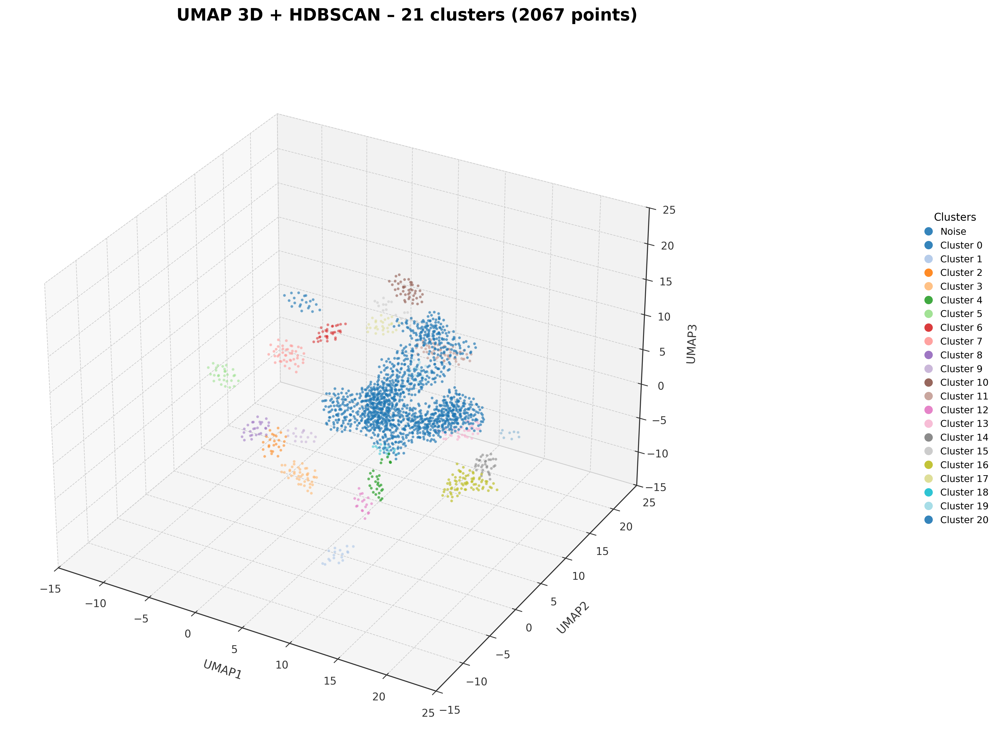


✓ Stage 4 completed in 7.56s
  Saved: outputs/figures/


In [41]:
print("\n=== STAGE 4: UMAP 3D Topological Projection ===")
stage_start = time.time()

# 4.1 --- Project observations (by continent) ---
print("  [4.1] Projecting observations (colored by continent)...")
with capture_output() as captured:
    fig_plotly_obs, fig_mpl_obs = project_umap3d_observations(
        imputed=imputed_data,
        random_state=DEFAULT_RANDOM_STATE,
        apply_repulsion=True
    )
print(f"  ✓ Observation projection complete")
print(f"    Interactive: outputs/figures/msti_umap3d_observations.html")
print(f"    Static: outputs/figures/msti_umap3d_observations_static.png")
display(HTML("<br>"))
display(Image(OUTPUT_PATHS['figures'] / 'msti_umap3d_observations_static.png'))
plt.close('all')

# 4.2 --- Project clusters (HDBSCAN) ---
print("\n  [4.2] Projecting clusters (HDBSCAN density-based)...")
with capture_output() as captured:
    fig_plotly_clusters, fig_mpl_clusters = project_umap3d_clusters(
        imputed=imputed_data,
        min_cluster_size=15,
        min_samples=5,
        random_state=DEFAULT_RANDOM_STATE,
        apply_repulsion=True
    )
print(f"  ✓ Cluster projection complete")
print(f"    Interactive: outputs/figures/msti_umap3d_clusters.html")
print(f"    Static: outputs/figures/msti_umap3d_clusters_static.png")
display(HTML("<br>"))
display(Image(OUTPUT_PATHS['figures'] / 'msti_umap3d_clusters_static.png'))
plt.close('all')

elapsed = time.time() - stage_start
pipeline_metadata["stage4_time"] = elapsed

# 4.3 --- Display summary ---
print(f"\n✓ Stage 4 completed in {elapsed:.2f}s")
print(f"  Saved: outputs/figures/")

### **Interprétations**<br>

#### **1. Projection UMAP 3D – Lecture par observations**
La projection UMAP 3D montre une structure globale organisée autour :

- **D'un noyau central très dense :**
    - Dominé par les pays européens (30 sur 47 : 64% des pays OCDE élargis)
    - Homogénéité relative des systèmes S&T européens sur 40 ans
    - Effet mécanique de sur-représentation dans les données + proximité structurelle réelle des indicateurs (GERD, chercheurs, dépenses publiques/privées, outputs techno)
</br><br>

- **De groupes continentaux distincts en périphérie :**
    - **Europe** *(30 pays)* :
        - Amas compact, continuité forte entre pays
        - Convergence structurelle autour de normes similaires (politiques R&D, structures industrielles, intégration UE)
    - **Amérique** *(7 pays)* : 
        - Deux groupes principaux, un groupe dans la zone centrale-basse et des clusters périphériques gauche et bas-droite
        - Reflète l’hétérogénéité du continent en termes d’intensité R&D et capacités technologiques
    - **Asie** *(7 pays)* :   
        - Groupes périphériques très différenciés
        - Signale la diversité des trajectoires d’investissement, modèles industriels et degrés de spécialisation technologique
    - **Océanie** *(2 pays)* :  
        - Petit groupe périphérique distinct, en périphérie du bloc européen
    - **Afrique** *(1 pays)* :   
        - Points isolés en périphérie, représentant l'Afrique du Sud
    </br><br>
- **D'une convergence temporelle :**
     - **Années 1980**  
         - Dispersion forte → systèmes nationaux très différenciés, nombreuses trajectoires périphériques
     - **Années 1990–2000** 
         - Rapprochements → harmonisation progressive des indicateurs (notamment en Europe)
     - **Depuis 2000**
        - Convergence globale portée par :  
              → diffusion des standards internationaux en mesure et financement R&D  
              → montée en puissance de l’Asie rattrapant les pays leaders  
              → politiques d’innovation structurées dans l’OCDE
<br>

#### **2. Clustering automatique (HDBSCAN)**
L'algorithme a identifié **21 clusters naturels** parmi les 2 067 observations (pays×année), révélant une **forte hétérogénéité des trajectoires** :
- **Clusters 0, 1, 4** *(bleus dominants)* :
    - Représentent 60–70% des observations
    - Correspondent quasi exclusivement aux pays européens
    - Reflètent un bloc homogène en termes d’indicateurs, malgré les écarts nationaux
    - Forte densité = forte similarité structurelle (périodes et niveaux convergents)
 </br><br>
- **Clusters périphériques** *(2, 3, 5, 6, 7, 8, 9… 20)* :
    - Groupes plus petits représentant des configurations S&T spécifiques,
    - Certains sont compacts (ex: cluster 4 vert clair en bas), d'autres plus diffus.
</br><br>
- **Cluster Noise** *(gris clair)* : 
    - Points non assignés = observations atypiques ou transitoires
    - Correspondent souvent aux premières années (1980s) ou à des pays aux configurations instables.
    </br><br>


#### ➤ **Implications méthodologiques**
La projection UMAP conserve les relations locales dans l’espace $\mathbb{R}^{89}$, avec 21 clusters identifiés, les trajectoires S&T nationales suivent des configurations structurelles distinctes, indépendamment de la géographie ou du temps.


---
<a id="stage5-univariate"></a>

## Stage 5.5 — Univariate Analysis

**Module**: `msti_analysis_univariate.py`

**Objectif** : Statistiques descriptives et visualisation par blocs thématiques OCDE.

**Étapes de transformation** :
1. `describe_univariate` : Calcul statistiques (moyenne, std, quartiles) sur variables z-scorées
2. `plot_boxplots` : Génération boxplots groupés par blocs thématiques
3. Coloration outliers par continent
4. Export CSV (statistiques) et PNG (visualisations)

**Input** : `data/processed/msti_imputed.csv`

**Output** : 
- `outputs/reports/msti_univariate_statistics.csv`
- `outputs/figures/msti_boxplot_variables.png`


In [8]:
print("\n=== STAGE 5: Univariate Descriptive Analysis ===")
stage_start = time.time()

# 5.1 --- Prepare data ---
if isinstance(imputed_data.index, pd.MultiIndex):
    countries = imputed_data.index.get_level_values(0) 
else:
    countries = imputed_data.index
continents = countries.map(COUNTRY_TO_CONTINENT)
imputed_data = imputed_data.copy()
imputed_data["continent"] = continents
imputed_data["zone"] = imputed_data["continent"]

# 5.2 --- Compute descriptive statistics ---
print("  [5.1] Computing descriptive statistics...")
with capture_output() as captured:
    univariate_result = describe_univariate(imputed_data)
print(f"  ✓ Statistics: outputs/reports/msti_univariate_statistics.csv")
display(HTML("<br>"))
display(univariate_result['data']  )

# 5.3 --- Generate boxplots by thematic blocks ---
print("\n  [5.2] Generating boxplots by thematic blocks...")
with capture_output() as captured:
    boxplot_result = plot_boxplots(imputed_data)
print(f"  ✓ Boxplots: outputs/figures/msti_boxplot_variables.png")
display(HTML("<br><br>"))
display(Image(OUTPUT_PATHS['figures'] / 'msti_boxplot_variables.png'))
plt.close('all')

elapsed = time.time() - stage_start
pipeline_metadata["stage5_time"] = elapsed

print(f"\n✓ Stage 5 completed in {elapsed:.2f}s")
print(f"  Variables analyzed: {univariate_result['metadata']['n_variables']}")
print(f"  Thematic blocks: {boxplot_result['metadata']['n_blocks']}")
print(f"  Saved: outputs/reports/ & outputs/figures/")


=== STAGE 5: Univariate Descriptive Analysis ===
  [5.1] Computing descriptive statistics...
  ✓ Statistics: outputs/reports/msti_univariate_statistics.csv


indicator,Brevpct_nb,Brevtech_nb,Brevtic_nb,Brevtriad_%brev,Brevtriad_nb,CBPRD_$,CBPRDciv_%cbprd,CBPRDdef_%cbprd,CBPRDdeveco_%cbprdciv,CBPRDenssoc_%cbprdciv,...,PIB_ind,PPA_$,Pop_nb,RDcher_1kemp,RDcher_etp,RDcherfme_%cher,RDcherfme_nb,RDpers_1kemp,RDpers_etp,Rechfond_%pib
count,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,...,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00,2067.00
mean,0.00,0.00,0.00,-0.01,-0.02,-0.11,0.14,-0.14,-0.02,-0.07,...,0.00,-0.02,-0.02,-0.04,-0.11,-0.01,-0.24,0.00,-0.09,-0.04
std,1.01,1.01,1.02,0.97,0.95,0.84,0.82,0.82,0.83,0.81,...,0.97,0.97,0.97,0.80,0.84,0.65,0.69,0.80,0.83,0.72
min,-0.26,-0.30,-0.25,-0.34,-0.34,-0.46,-5.15,-0.57,-2.19,-0.85,...,-1.21,-0.30,-0.32,-1.67,-0.47,-2.76,-0.77,-1.85,-0.39,-1.62
25%,-0.26,-0.30,-0.25,-0.34,-0.33,-0.39,0.27,-0.49,-0.43,-0.34,...,-0.35,-0.30,-0.29,-0.42,-0.40,0.01,-0.43,-0.32,-0.32,-0.19
50%,-0.25,-0.28,-0.24,-0.33,-0.32,-0.34,0.40,-0.40,-0.10,-0.18,...,0.05,-0.30,-0.27,-0.10,-0.35,0.03,-0.42,0.01,-0.29,-0.11
75%,-0.13,-0.15,-0.18,-0.21,-0.20,-0.23,0.49,-0.27,0.33,-0.01,...,0.37,-0.26,-0.08,0.14,-0.28,0.03,-0.42,0.32,-0.23,0.05
max,11.03,8.32,11.16,5.58,6.37,6.84,0.57,5.15,3.23,17.76,...,33.21,7.94,7.20,3.02,10.07,1.94,4.80,3.10,12.70,6.46



  [5.2] Generating boxplots by thematic blocks...
  ✓ Boxplots: outputs/figures/msti_boxplot_variables.png



✓ Stage 5 completed in 15.56s
  Variables analyzed: 89
  Thematic blocks: 8
  Saved: outputs/reports/ & outputs/figures/


### **Interprétations**<br>
#### **Transformation z-score**
Les 89 variables ont été standardisées $(\mu = 0,\ \sigma = 1)$ pour assurer la comparabilité des indicateurs exprimés dans des unités hétérogènes (dollars, pourcentages, effectifs).
<br><br>

#### **Distribution des variables standardisées :**
- **Asymétrie généralisée** : 86/89 variables (96,6%) ont une médiane négative et 76/89 (85,4%) une moyenne négative
> *Ce biais reflète la concentration des valeurs extrêmes positives chez quelques pays leaders, tirant la majorité des observations vers des z-scores négatifs.*
- **Outliers extrêmes** : Certaines variables présentent des valeurs >10σ, reflétant des systèmes S&T très dynamiques
<br>

#### **Patterns continentaux par blocs thématiques :**
Les boxplots révèlent des dispersions contrastées selon les continents :

- `INPUT_EXPENDITURE_R&D` (*dépenses R&D totales/sectorielles, \$ et %PIB*)
    - **Asie/Amérique** : outliers en intensité R&D
    - **Europe** : interquartiles serrés, faible dispersion entre pays
</br><br>
- `INPUT_GOV_BUDGET_R&D` (*budgets publics, civil/défense, allocations thématiques*)
    - **Amérique** : outliers sur volumes `CBPRD_$` → budgets publics R&D élevés
    - **Asie** : outliers sur `CBPRDdef_%cbprd` → part défense/CBPRD total élevée
    - **Europe** : outliers sur allocations espace/université → priorités recherche fondamentale/spatiale
</br><br>
- `INPUT_HUMAN_R&D` (*chercheurs, personnel R&D par secteur, ratios/emploi*)
    - **Asie/Amérique** : outliers sur effectifs absolus → Systèmes S&T de grande taille
    - **Asie** : outliers sur ratios chercheurs/1000 employés → Densité chercheurs élevée relativement à l'emploi total
    - **Europe** : distributions serrées autour de la médiane, faible variabilité inter-pays
</br><br>
- `INPUT_SECTORAL_R&D` (*répartitions manufacturing/services/aéro/pharma/TIC*)
    - **Europe** : outliers sur DIRDES → part R&D enseignement supérieur élevée
    - **Asie** : outliers sur DIRDE → part R&D entreprises élevée
    - Opposition manufacturing (**Asie**) vs services (**Europe/Amérique**) → différences structures productives
</br><br>
- `OUTPUT_PATENTS` (*brevets triades/PCT/TIC/pharma*)
    - Outliers massifs **Amérique** et **Asie** → innovation brevetée élevée
    - **Europe** : production brevetée médiane, faible dispersion
</br><br>
- `OUTPUT_TRADE_EXPORTS` (*exportations aéro/électronique/pharma en % exports*)
    - **Asie/Amérique** : outliers sur aérospatial et électronique → exportations high-tech
    - **Europe** : outliers sur pharmaceutique → spécialisation sectorielle pharmaceutique
</br><br>
- `MACRO_GDP` (*PIB, parité pouvoir d'achat*)
    - **Amérique** : outliers sur PIB_ind → PIB très élevé
</br><br>
- `MACRO_EMPLOYMENT` (*population, emploi total*)
    - **Asie/Amérique** : outliers sur population/emploi total → démographique, pays de grande taille 
    - **Europe** : distributions médianes, faible variabilité entre pays
</br><br>

#### **Typologie continentale :**
| Continent | Caractéristiques |
|-----------|------------------|
| **Asie** | Intensité R&D, outputs technologiques |
| **Amérique** | Volumes (PIB, dépenses, effectifs, brevets), GERD |
| **Europe** | Homogénéité, modèle académique, niches pharmaceutiques |

</br><br>
#### ➤ **Implications méthodologiques**
L'hétérogénéité marquée des dispersions entre blocs thématiques révèlent des modèles structurels distincts selon les zones géographiques et les spécialisations économiques. <br>La présence systématique d'outliers continentaux confirme que les systèmes S&T nationaux ne suivent pas une distribution normale unique.



---
<a id="stage6-multivariate"></a>

## 5.6 Stage 6 — Multivariate Analysis (CAH + MFA)

**Module :**  `msti_corr_analysis.py` +  `src/s05_analysis/msti_cah_mfa.py`
<br>*Détail méthodologique : voir `documentation/methodology/mfa_pca.docx` et `documentation/methodology/protocole_statistique.docx`*

**Objectif :** Analyses multivariées pour explorer la structure globale et identifier les patterns multidimensionnels.
Détail méthodologique
**Étapes de transformation :**

**6.1 Matrice de corrélation :**
1. `plot_correlation_matrix` : Calcul corrélations Pearson (89×89)
2. Masquage triangle supérieur + export heatmap annoté

**6.2 CAH (Clustering hiérarchique) :**
1. `cluster_variables_hierarchical` : Linkage Ward sur distance euclidienne
2. Critère coude (accélération inertie) + score silhouette pour k optimal
3. Génération dendrogramme + courbes évaluation

**6.3 MFA (Analyse factorielle multiple) :**
1. PCA par bloc thématique OCDE avec pondération adaptative
2. PCA globale sur axes pondérés des blocs
3. Calcul COS² (qualité représentation) et CTR (contributions)
4. Cercles de corrélation (F1×F2, F1×F3)
5. Projections observations (barycentres continentaux + trajectoires pays lissées par splines cubiques)

**Input :** `data/processed/msti_imputed.csv`

**Output :** 
- `outputs/reports/msti_correlation_matrix.csv`
- `outputs/figures/msti_cah_{dendrogram|evaluation}.png`
- `outputs/figures/msti_mfa_{cattell|correlation_circle|projection}*.png`
- `data/processed/msti_mfa_final.csv` (coordonnées factorielles)



=== STAGE 6: Multivariate Analysis ===
  [6.1] Computing correlation matrix...
  ✓ Mean |r|: 0.244
  ✓ Heatmap: outputs/figures/msti_correlation_matrix.png
  ✓ Matrix CSV: outputs/reports/msti_correlation_matrix.csv

=== Top 10 positive correlations (r > 0.7) ===
  DIRD_$                                   <-> DIRDE_$                                   r =  0.995
  DIRDEentr_$                              <-> DIRDE_$                                   r =  0.985
  DIRD_$                                   <-> DIRDEentr_$                               r =  0.977
  DIRDentr_$                               <-> DIRDE_$                                   r =  0.977
  DIRD_%pib                                <-> DIRDE_%pib                                r =  0.976
  DIRDETper_etp                            <-> DIRDETcher_etp                            r =  0.973
  DIRDentr_$                               <-> DIRD_$                                    r =  0.973
  Brevtic_nb                       

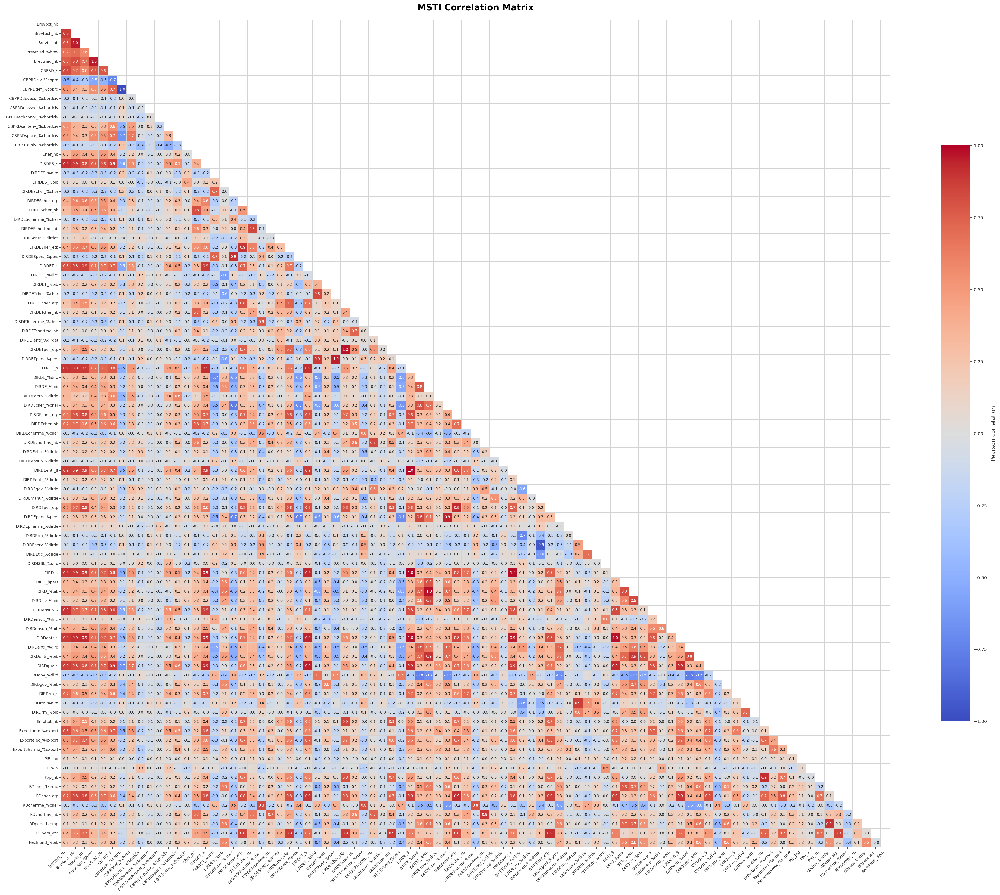

In [9]:
print("\n=== STAGE 6: Multivariate Analysis ===")
stage_start = time.time()

# 6.1 --- Correlation matrix ---
print("  [6.1] Computing correlation matrix...")
plt.ioff()
with capture_output():
    corr_result = plot_correlation_matrix(imputed_data)
plt.close('all')
print(f"  ✓ Mean |r|: {corr_result['metadata']['mean_abs_correlation']:.3f}")
print(f"  ✓ Heatmap: outputs/figures/msti_correlation_matrix.png")
print(f"  ✓ Matrix CSV: outputs/reports/msti_correlation_matrix.csv")

# Top correlations
corr_matrix = corr_result['data']
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
corr_flat = corr_matrix.where(~mask).stack()
top_pos = corr_flat[corr_flat > 0.7].sort_values(ascending=False).head(10)
top_neg = corr_flat[corr_flat < -0.7].sort_values().head(10)

if len(top_pos) > 0:
    print("\n=== Top 10 positive correlations (r > 0.7) ===")
    for (var1, var2), corr in top_pos.items():
        print(f"  {var1:40s} <-> {var2:40s}  r = {corr:6.3f}")

if len(top_neg) > 0:
    print("\n=== Top 10 negative correlations (r < -0.7) ===")
    for (var1, var2), corr in top_neg.items():
        print(f"  {var1:40s} <-> {var2:40s}  r = {corr:6.3f}")

display(Image(corr_result['figures']['heatmap']))

### **STAGE 6.1 — Analyse Corrélations Variables**<br>


#### **Vue d’ensemble**

- **Nombre de paires analysées** : 3 916
- **Niveau général des corrélations** :
  - Moyenne $|r̄|$ = 0,235 → **structure globalement modérée**
- **Multicolinéarité** : quasi-absence
  - $|r|$ > 0,90 : 0,9% des paires → rares colinéarités extrêmes
  - $|r|$ > 0,70 : 5,4% → faible redondance

**Conclusion** : la structure de dépendance est suffisamment diffuse pour conserver l’intégralité des 89 variables dans les phases ultérieures (MFA, clustering).

<br>


#### **Corrélations positives marquées**

| Thème | Observations | Interprétation |
|-------|-------------|----------------|
| **Brevets inter-catégories** | $r$ = 0,871 → 0,960 | Quasi-colinéarité |
| **DIRD totale ↔ DIRD par secteur** | $r$ = 0,924 → 0,995 | Corrélations mécaniques, effets d’agrégation |
| **Intensité R&D (%PIB)** | $r$ = 0,976 | Cohérence macro ↔ micro |
| **Personnel R&D** | $r$ = 0,891 → 0,973 | Logique de cohésion entre chercheurs, ingénieurs et effectifs totaux |
| **Budgets publics R&D** | $r$ = -1 → 0,858 | Arbitrages stratégiques nationaux (défense ↔ civil, public ↔ académique) |
| **INPUT → OUTPUT** | $r̄$ = 0,191 | Influence positive mais modérée : rôle de la structure et de l’efficacité du système national |

**Blocs cohésifs** :
- **OUTPUT_PATENTS** : cohésion exceptionnelle (toutes les paires $r$ > 0,70)
- **INPUT_HUMAN** et **INPUT_EXPENDITURE** : cohésion intermédiaire, structure plus hétérogène

<br>

#### **Oppositions fortes (corrélations négatives $r$ < -0,70)**

| Thème | Observations | Interprétation |
|-------|-------------|----------------|
| Désindustrialisation | $r$ = -0,942 | Transition structurelle : manufacturing ↓, services ↑ |
| Modèles institutionnels (public vs privé) | $r$ = -0,750 → -0,777 | Oppositions entre systèmes tirés par le marché vs par l’État |
| Allocation chercheurs (académie vs industrie) | $r$ = -0,776 | Recherche fondamentale vs appliquée |
| Budgets publics (taille vs orientation) | $r$ = -0,720 | Les pays à très forts budgets privilégient souvent la défense |

<br>

#### **Cohésion intra-blocs**

| Bloc | $r̄$ | Cohésion |
|------|-----|----------|
| OUTPUT_PATENTS | 0.781 | Très forte |
| OUTPUT_TRADE | 0.469 | Forte |
| INPUT_HUMAN | 0.322 | Modérée |
| INPUT_GOV_BUDGET | 0.285 | Modérée |
| INPUT_EXPENDITURE | 0.251 | Modérée-faible |

<br>

#### ➤ **Implications méthodologiques**
l'absence de multicolinéarité excessive (95,4% des paires avec $|r|$ < 0,70) justifie la conservation des 89 variables.


  [6.2] Hierarchical clustering (Ward linkage)...
  ✓ Elbow: 18 clusters
  ✓ Silhouette max: 13 clusters (score=0.211)
  ✓ Dendrogram: outputs/figures/msti_cah_dendrogram.png
  ✓ Evaluation: outputs/figures/msti_cah_evaluation.png

=== CAH Evaluation Metrics ===
  Best silhouette score: 0.211
  Optimal clusters range: 18-13


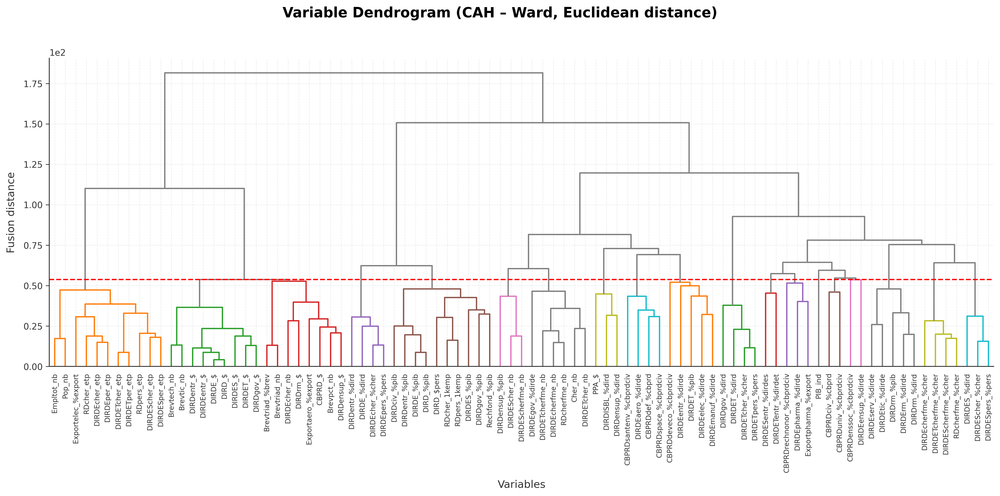

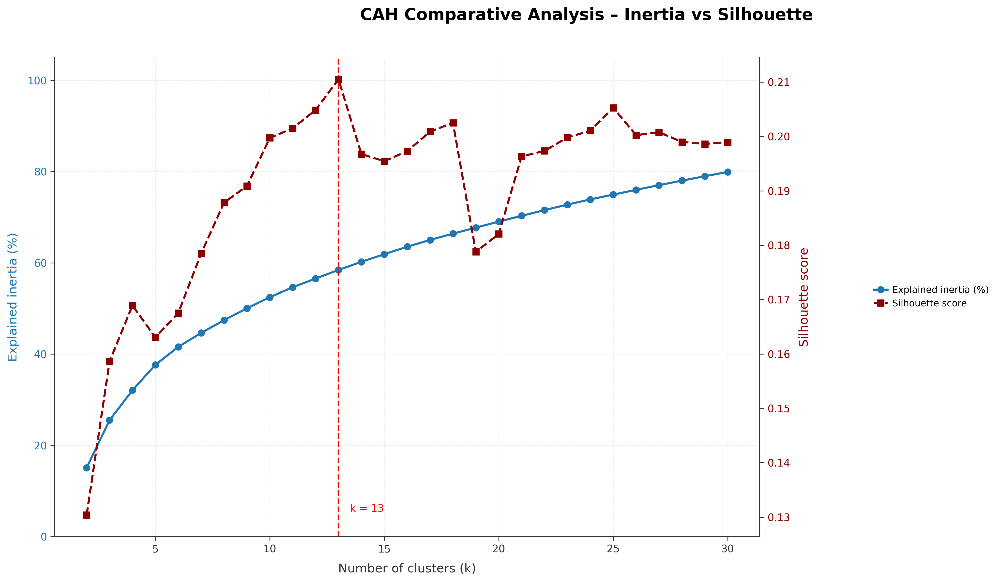

In [10]:
# 6.2 --- Hierarchical clustering (CAH) ---
print("\n  [6.2] Hierarchical clustering (Ward linkage)...")
with capture_output():
    cah_result = cluster_variables_hierarchical(imputed_data)
plt.close('all')
print(f"  ✓ Elbow: {cah_result['metadata']['n_clusters_elbow']} clusters")
print(f"  ✓ Silhouette max: {cah_result['metadata']['n_clusters_silhouette']} clusters (score={cah_result['metadata']['best_silhouette']:.3f})")
print(f"  ✓ Dendrogram: outputs/figures/msti_cah_dendrogram.png")
print(f"  ✓ Evaluation: outputs/figures/msti_cah_evaluation.png")

elbow_n = cah_result['metadata']['n_clusters_elbow']
silhouette_n = cah_result['metadata']['n_clusters_silhouette']
best_sil = cah_result['metadata']['best_silhouette']

print(f"\n=== CAH Evaluation Metrics ===")
print(f"  Best silhouette score: {best_sil:.3f}")
print(f"  Optimal clusters range: {elbow_n}-{silhouette_n}")

display(Image(cah_result['figures']['dendrogram']))
display(Image(cah_result['figures']['evaluation']))

### **Interprétations**<br>


#### **Méthode utilisée**
Clustering Ascendant Hiérarchique (CAH) avec le **critère de Ward**, appliqué aux 2 067 observations décrites par les 89 variables. 
<br>Le critère de Ward vise à minimiser l’inertie intra-cluster tout en maximisant la séparation inter-cluster.

#### **Choix du nombre de clusters**
Plusieurs indicateurs convergent vers une structure faiblement segmentée :
- **Faible inertie inter-classe** (58-60% à k=13) : les groupes restent peu séparés
- **Inertie intra-classe élevée** (40-42%) : les clusters demeurent larges et hétérogènes
- **Score silhouette bas** (0,211) : les frontières entre groupes sont floues, la structure n'est pas nettement partitionnable
<br>

- **Méthode du coude :**
    - L'inertie intra-classe décroît régulièrement, sans inflexion notable
    - Aucun nombre naturel de clusters ne se détache clairement

<br>

Le dendrogramme révèle une **structure à plusieurs niveaux** :
- **Cluster principal droit** (hauteur ≈1.8) : intrants R&D (DIRD, DIRDE, DIRDES, personnels)
- **Clusters secondaires** (≈1.0-1.5) : sous-groupes thématiques (brevets, budgets gouvernementaux)
- **Clusters unitaires** : variables faiblement corrélées

#### **Critères d'évaluation (deux optima)**

| Critère | Valeur optimale | Interprétation |
|---------|----------------|----------------|
| **Coude** | k=**18 clusters** | Accélération maximale décroissance inertie, compromis granularité/parcimonie |
| **Silhouette** | k=**13 clusters** (score=0.211) | Meilleure cohésion intra-cluster vs séparation inter-cluster |

<br>

#### **Lecture du dendrogramme**
Le dendrogramme des 89 variables présente des hauteurs de fusion très variées (0 à ~180), confirmant une forte hétérogénéité et une structure hiérarchique complexe, aucune partition nette ne s'impose visuellement.

<br>

#### ➤ **Implications méthodologiques** 
La CAH avec critère de Ward ne révèle pas de segmentation robuste de l'espace 89-dimensionnel : inertie inter-classe limitée (~58-60%), inertie intra-classe élevée (~40-42%), silhouette faible (0,211).

In [11]:
# 6.3 --- Multiple Factor Analysis (MFA) ---
print("\n  [6.3] Multiple Factor Analysis...")

# Capture output and filter pathsold_stdout = sys.stdout
old_stdout = sys.stdout
buffer = io.StringIO()
sys.stdout = buffer
mfa_exports, _ = run_mfa_projection(imputed_data)
output = buffer.getvalue()
sys.stdout = old_stdout

# Display everything EXCEPT lines “exported →” with long paths
for line in output.split('\n'):
    if 'exported →' not in line or '/mnt/c/' not in line:
        print(line)

print(f"  Inertia: outputs/reports/msti_mfa_inertia.csv")
print(f"  Variable metrics: outputs/reports/msti_mfa_variable_metrics.csv")
print(f"  Observation metrics: outputs/reports/msti_mfa_obs_metrics.xlsx")
print(f"  Sparse PCA: data/processed/msti_spca_final.csv")


  [6.3] Multiple Factor Analysis...

=== STEP: Multiple Factor Analysis ===
⚠ Missing variables: ['RDcher_nb']
• MFA structure: 90 variables in 8 blocks
• Retained 89 variables across 8 thematic blocks

=== Principal eigenvalues and relative weights per MFA block === 
  Block 'INPUT_EXPENDITURE_R&D': λ1=7.314, weight=0.370
  Block 'INPUT_GOV_BUDGET_R&D': λ1=2.523, weight=0.630
  Block 'INPUT_HUMAN_R&D': λ1=6.364, weight=0.396
  Block 'INPUT_SECTORAL_R&D': λ1=1.933, weight=0.719
  Block 'OUTPUT_PATENTS': λ1=4.095, weight=0.494
  Block 'OUTPUT_TRADE_EXPORTS': λ1=1.311, weight=0.873
  Block 'MACRO_GDP': λ1=1.003, weight=0.999
  Block 'MACRO_EMPLOYMENT': λ1=1.716, weight=0.763

=== Cumulative Inertia on Axes ===
Component  Inertia (%)  Cumulative Inertia (%)
       F1        48.53                   48.53
       F2        12.96                   61.49
       F3        12.45                   73.94
       F4        10.14                   84.09
       F5         6.06                   90.14


  [6.4] Generating MFA visualizations...


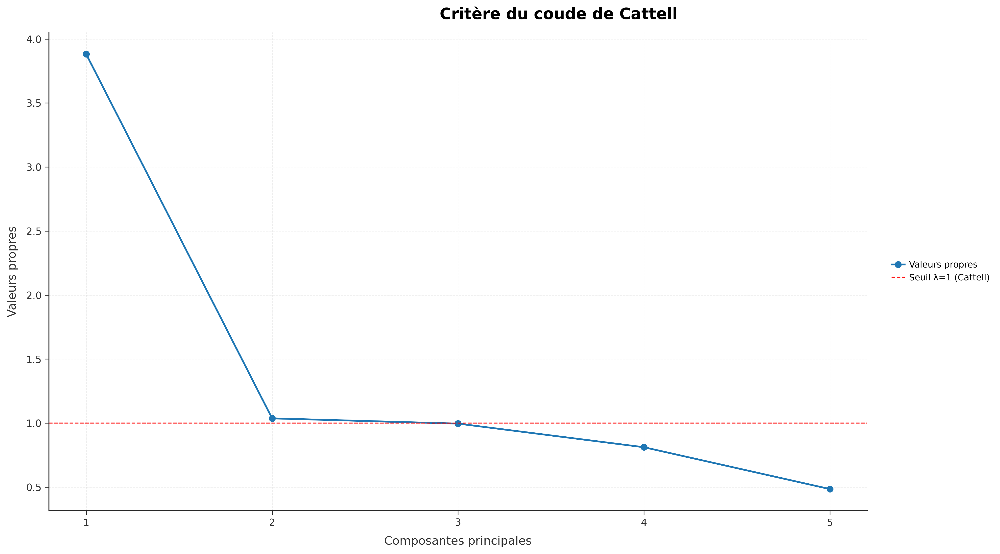

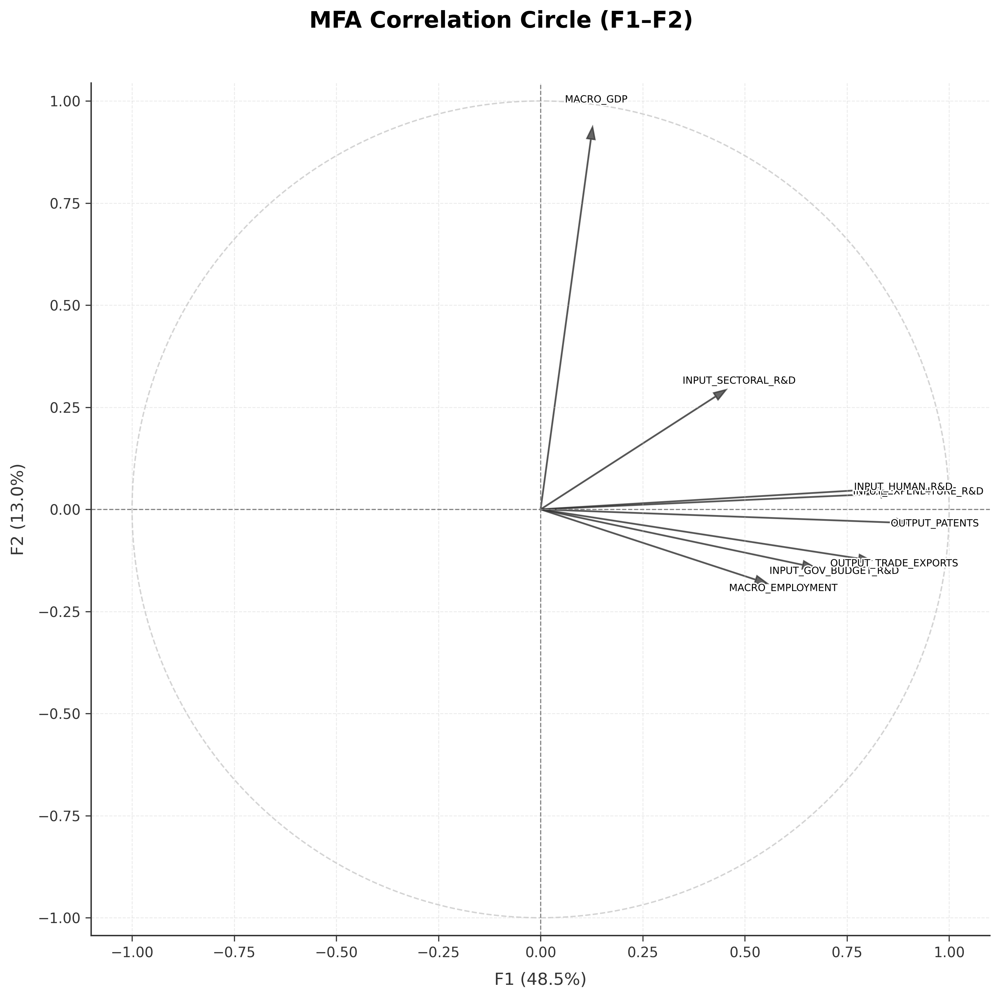

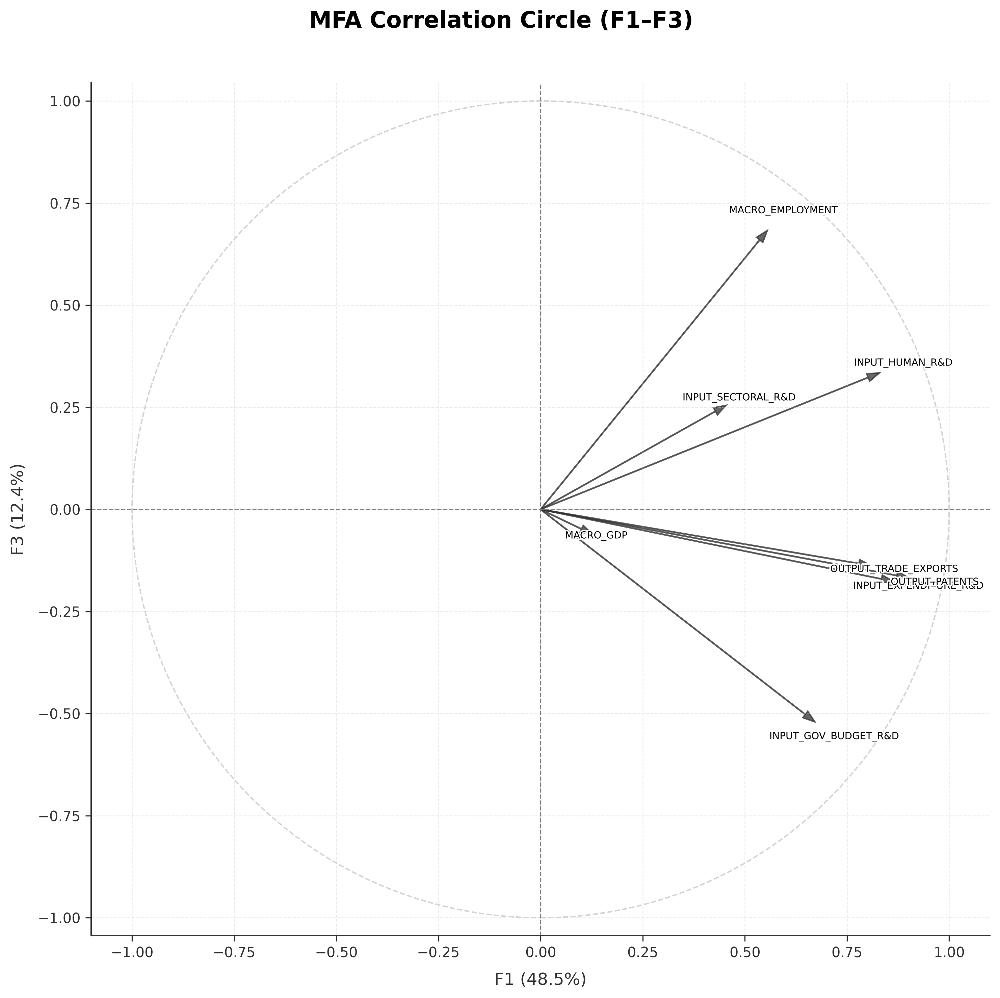

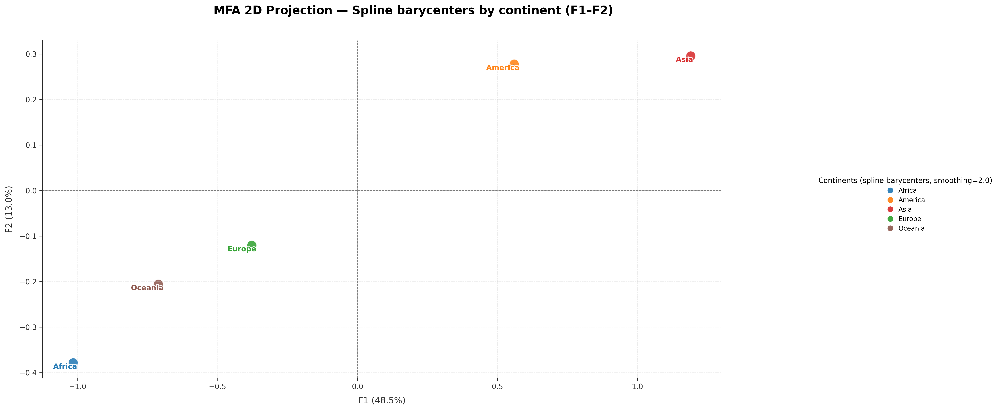

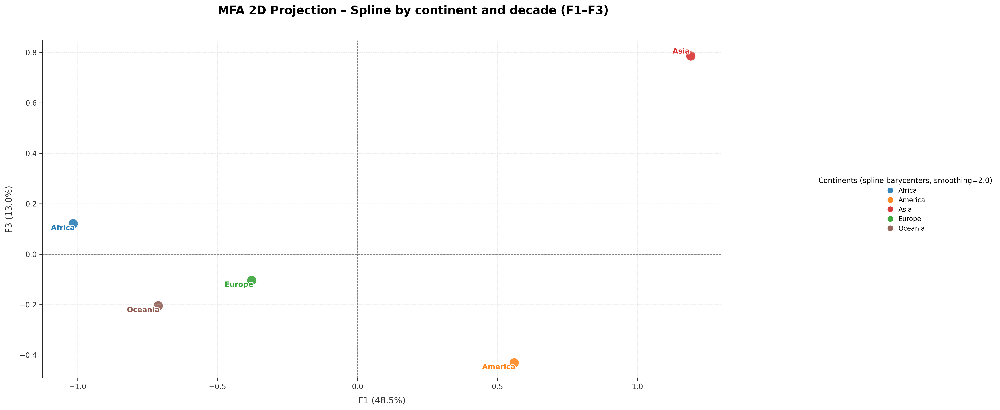

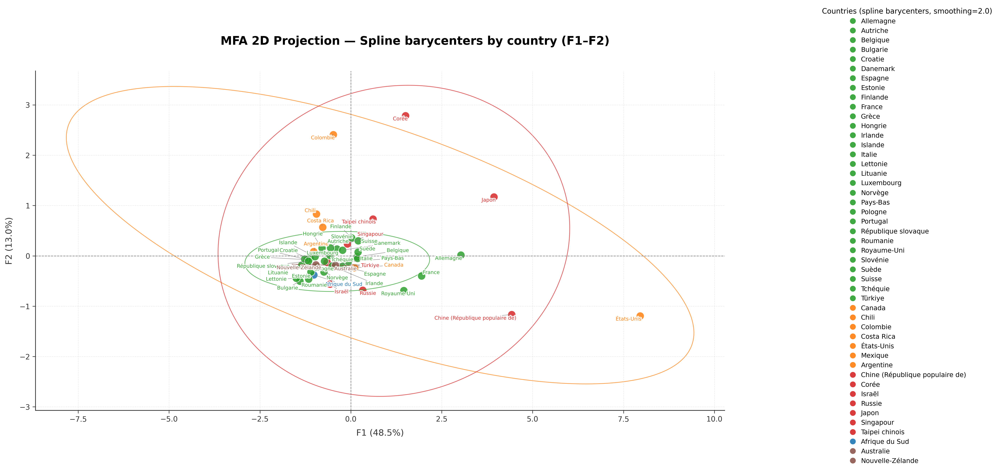

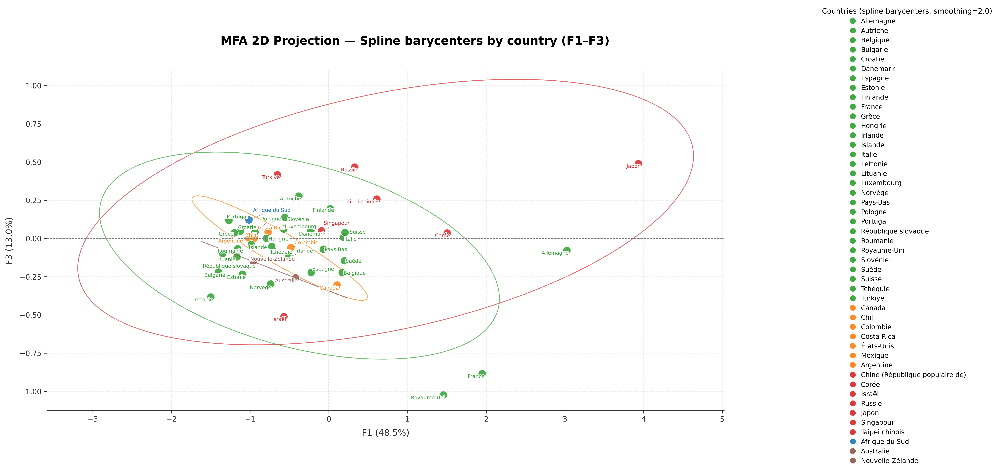


✓ Stage 6 completed in 38.44s


In [13]:
# 6.4 --- MFA Visualizations ---
print("\n  [6.4] Generating MFA visualizations...")
obs_coords = mfa_module.obs_coords_df
correlations = mfa_module.correlations_df
explained_var = mfa_module.explained_variance

with capture_output():
    _, path1 = plot_cattell_criterion(np.array(mfa_exports['eigenvalues']), np.array(mfa_exports['explained_variance']))
    _, path2 = plot_mfa_correlation_circle_f12(correlations, explained_var)
    _, path3 = plot_mfa_correlation_circle_f13(correlations, explained_var)
    _, path4 = plot_mfa_projection_continents_f12(obs_coords, explained_var, imputed_data)
    _, path5 = plot_mfa_projection_continents_f13(obs_coords, explained_var, imputed_data)
    _, path6 = plot_mfa_projection_countries_f12(obs_coords, explained_var, imputed_data)
    _, path7 = plot_mfa_projection_countries_f13(obs_coords, explained_var, imputed_data)

for path in [path1, path2, path3, path4, path5, path6, path7]:
    display(Image(path))
plt.close('all')

elapsed = time.time() - stage_start
pipeline_metadata["stage6_time"] = elapsed

print(f"\n✓ Stage 6 completed in {elapsed:.2f}s")
plt.ion()

### **Interprétations**<br>

#### **1. Analyse des variables et des axes factoriels**

#### **Une structure factorielle concentrée sur 3 axes**

L'analyse MFA révèle une structure factorielle concentrée sur **trois axes**, résume près des **3/4 de la variance totale** :

| Axe | Inertie | Cumulée | Lecture synthétique |
|-----|---------|---------|----------------|
| **F1** | **48,5%** | 48,5% | *Puissance R&D* : taille / intensité du système S&T |
| **F2** | **13,0%** | 61,5% | *Dimension macro-économique* : taille économique (PIB) |
| **F3** | **12,4%** | 73,9% | *Variance résiduelle* : multi-facteurs |

<br>

#### **F1 (48,5%) - Dimension dominante "Puissance R&D"**

L'axe principal capture **près de la moitié** de la variance totale, reflétant la **taille et intensité** du système S&T national :

- **Pôle positif (+F1)** :  zones à fort volume R&D → R&D abondante, forte capacité d’innovation, ressources importantes
- **Pôle négatif (-F1)** : petites économies → systèmes R&D plus restreints, faibles volumes

→ La structure MFA confirme ainsi que, malgré la standardisation Z-score, la dimension de l’économie et sa densité en R&D reste le premier facteur explicatif.

<br>

#### **F2-F3 (25,4%) - Dimensions structurelles secondaires**

**F2 (13%) - "Dimension macro-économique (PIB)"**

Un axe unidimensionnel quasi-exclusivement porté par `MACRO_GDP` :
- `MACRO_GDP` : COS² F2 = **87,7%** | CTR F2 = **84,6%**
- `INPUT_SECTORAL_R&D` : COS² F2 = 8,6% | CTR F2 = 8,3%
- Tous les autres blocs : COS² F2 < 3%

→  F2 est un axe unidimensionnel, purement économique, centré sur la taille du PIB, sans autre structure explicative : il mesure la **variance économique macro** (`PIB_ind`, `PPA_$`), orthogonale à F1, indépendamment de l'intensité R&D.

<br>

**F3 (12,4%) - "Variance résiduelle multi-facteurs"**

Axe porté par plusieurs blocs positifs :
- `MACRO_EMPLOYMENT` : COS² F3 = **46,7%** | CTR F3 = **46,8%**
- `INPUT_GOV_BUDGET_R&`** : COS² F3 = **27,1%** | CTR F3 = **27,2%**
- `INPUT_HUMAN_R&D` : COS² F3 = 11,2% | CTR F3 = 11,2%
- `INPUT_SECTORAL_R&D` : COS² F3 = 6,5% | CTR F3 = 6,5%

→ Structure multi-factorielle complexe sans opposition binaire claire

**Note méthodologique** : Les visualisations F1×F2 (61,5% variance) sont privilégiées pour l'analyse principale. F3 contribue 12,4% variance supplémentaire mais nécessite prudence interprétative.

<br>

#### **Critère de Kaiser (valeurs propres)**

Valeurs propres : **λ₁=3.88**, **λ₂=1.04**, **λ₃=1.00**

- F1 (λ>1) → dépasse strictement le seuil 
- F2 et F3 (λ≈1) → apportent une dimension thématique significative

Les 3 premiers axes expliquent **73,9%** de la variance représentation synthétique efficace du dataset.

<br>

#### **Qualité représentation blocs thématiques (COS² sur F1-F3)**

| Bloc | COS² | Qualité | Interprétation |
|------|------|---------|----------------|
| `MACRO_GDP` | **89,7%** | Excellent | Quasi-totalement expliqué par F1-F3 |
| `OUTPUT_PATENTS` | **84,2%** | Excellent | Très bien capturé |
| `MACRO_EMPLOYMENT` | **80,8%** | Excellent | Très bien capturé |
| `INPUT_HUMAN_R&D` | **80,2%** | Excellent | Très bien capturé |
| `INPUT_EXPENDITURE_R&D` | **77,9%** | Bien | Bien capturé |
| `INPUT_GOV_BUDGET_R&D` | **74,2%** | Bien | Bien capturé |
| `OUTPUT_TRADE_EXPORTS` | **68,9%** | Modéré | Modérément capturé |
| `INPUT_SECTORAL_R&D` | **35,7%** | Modéré | Dimension orthogonale F4-F5 |

**Interprétation COS²** 
La dimension macro (`MACRO_GDP`), les brevets (`OUTPUT_PATENTS`) et les ressources humaines allouées à la R&D (`INPUT_HUMAN_R&D`) sont **presque entièrement expliqués** par les 3 premiers axes, validant la structure factorielle identifiée.
Le bloc sectoriel `INPUT_SECTORAL_R&D` présente COS² modeste (35,7%), suggérant **dimension orthogonale** partiellement capturée par axes F4-F5 (non retenus pour visualisation mais contribuant 16,1% variance supplémentaire).

**Composition des 8 blocs thématiques OCDE**

| # | Bloc | N vars | Contenu principal |
|---|------|--------|-------------------|
| 1 | `INPUT_EXPENDITURE_R&D` | +60 | DIRD, DIRDE/DIRDES/DIRDET (secteurs), DIRDensup/entr/gov (sources) |
| 2 | `INPUT_GOV_BUDGET_R&D` | 9 | CBPRD total, civil/défense, objectifs socio-éco (santé, spatial) |
| 3 | `INPUT_HUMAN_R&D` | 11 | Chercheurs par secteur |
| 4 | `INPUT_SECTORAL_R&D` | 16 | DIRDE manuf/serv, branches (aero/elec/pharma/tic) |
| 5 | `OUTPUT_PATENTS` | 5 | Brevets PCT, tech, TIC, triades |
| 6 | `OUTPUT_TRADE_EXPORTS` | 3 | Exports aero/elec/pharma haute techno |
| 7 | `MACRO_GDP` | 2 | PIB, PPA |
| 8 | `MACRO_EMPLOYMENT` | 3 | Emploi total, recherche fondamentale |

**Total** : 89 variables

<br>

#### **2. Analyse du nuage des observations**


#### **Distribution quadrants F1×F2**

```
F2+ (PIB élevé)
         │
    Q II │ Q I
  (F1+F2-)│(F1+F2+)
─────────┼─────────► F1+ (Forte R&D)
  (F1-F2-)│(F1-F2+)
   Q III │ Q IV
         │
        F2- (PIB faible)
```


| Quadrant | F1 | F2 | Position | Interprétation |
|----------|----|----|----------|----------------|
| **Q I** | + | + | Haut-Droite | Forte R&D + PIB élevé |
| **Q II** | + | − | Bas-Droite | Forte R&D, mais PIB faible ou moyen |
| **Q III** | − | − | Bas-Gauche | Faible R&D + PIB faible |
| **Q IV** | − | + | Haut-Gauche | Faible R&D, mais PIB élevé |

<br>

#### **2.1 Continents - Barycentres**

Les continents se répartissent selon l'**intensité R&D (F1)** et la **taille économique (F2):**

| Continent | F1 | F2 | COS² F1×F2 | Position |
|-----------|-----|-----|------------|----------|
| **Asia** | +1.19 | +0.30 | 78,4% | Région la plus avancée (forte R&D + forte économie) |
| **America** | +0.56 | +0.28 | 87,8% | R&D et PIB supérieurs à la moyenne  |
| **Europe** | -0.38 | -0.12 | 88,9% | Profil intermédiaire et homogène |
| **Oceania** | -0.71 | -0.21 | 82,3% | Faible intensité R&D |
| **Africa** | -0.99 | -0.40 | 96,8% | Capacités R&D très limitées |

- **Structure géographique**: Opposition nette entre **l'Asie et l'Amérique (Q I → forte R&D, PIB élevé)** et **l'Europe, l'Océanie et l'Afrique (Q II → faible R&D et économie plus réduite)**.<br>
- **Qualité représentation continents**: Avec une moyenne du COS² de **86,8%**, les continents sont très bien représentés dans le plan F1×F2.

<br>

#### **2.2 Pays**

**Top 10 des puissances R&D (F1)**
| Rang | Pays | F1 | Interprétation |
|------|------|-----|----------------|
| 1 | **USA** | +7.95 | Leadership mondial en innovation |
| 2 | **Chine** | +4.43 | Investissements massifs, production scientifique élevée |
| 3 | **Japon** | +3.93 | Économie technologique très structurée |
| 4 | **Allemagne** | +3.02 | Industrie high-tech forte |
| 5 | **France** | +1.95 | R&D supérieure à la moyenne |
| 6 | **Corée** | +1.50 | R&D industrielle très intensive |
| 7 | **Royaume-Uni** | +1.45 | Excellence académique |
| 8 | **Taipei chinois** | +0.61 | Hub technologique régional |
| 9 | **Russie** | +0.33 | Héritage défense/spatial |
| 10 | **Suisse** | +0.20 | Excellence concentrée (pharma, biotech) |


**Économies à R&D limitées  (F1)**
| Rang | Pays | F1 | Interprétation |
|------|------|-----|----------------|
| 47 | **Lettonie** | -1.50 | Système embryonnaire |
| 46 | **Bulgarie** | -1.40 | transition post-soviétique |
| 45 | **Lituanie** | -1.35 | idem |
| 44 | **Portugal** | -1.26 | Périphérie européenne |
| 43 | **Grèce** | -1.20 | Impact durable de la crise économique |

Ces pays se situent nettement en dessous de la moyenne OCDE sur les déterminants R&D :
faible effort national, base industrielle réduite et production scientifique limitée.
Leur regroupement dans le quadrant III est logique, expliqué par le poids du premier axe (48,9%).


**Spécialisations sectorielles (F3)**<br>
L'axe F3 (12,4% variance) reflète les **spécialisations sectorielles fortes** non capturées par les axes R&D/PIB..

| Pays | COS² F1×F2 | COS² F3 | Interprétation spécialisation |
|------|------------|---------|------------------------------|
| **Chine** | **39,9%** | **60,1%** | Spécialisation manufacturière massive |
| **Russie** | 61,3% | 38,7% | Importance défense/spatial |
| **Canada** | 66,2% | 33,8% | Économie ressources naturelles |
| **Israël** | 68,3% | 31,7% | Spécialisation défense & high-tech |
| **Espagne** | 68,5% | 31,5% | Modèle intermédiaire |
| **Australie** | 69,5% | 30,5% | Spécialisation minière dominante |

**Cas critique — Chine** : 60,1% variance sur F3 confirme trajectoire R&D unique, non alignée sur axes principaux OCDE.


---

<a id="conclusion"></a>

# 6. Conclusion

## Synthèse générale

Le Pipeline MSTI a permis de traiter 45 années de données OCDE (1981-2025), transformant :

- **~600 000 lignes brutes** → **35 000 observations structurées**
- **36 variables originales** → **89 variables standardisées** (Z-score)

L'analyse révèle une **structure factorielle en trois dimensions (F1-F3)** expliquant **73,9%** de la variance totale. Ces axes permettent de caractériser les déterminants majeurs de l’hétérogénéité des systèmes scientifiques et technologiques (S&T) de 46 pays.


## Dimensions structurantes du système S&T

| Axe | Inertie | Interprétation |
|-----|---------|----------------|
| **F1** | 48,5% | **"Puissance R&D"** : volume des investissements, intensité et capacité S&T globale |
| **F2** | 13,0% | **"Dimension économique résiduelle"** : structure macro économique, effets taille/PIB et composition sectorielle |
| **F3** | 12,4% | **"Spécialisations sectorielles"** : poids relatif des dépenses sectorielles (défense, business, gouvernement) |

**Les trois axes cumulent 74 % de l’information totale**, permettant une représentation synthétique du paysage S&T mondial.


## Typologie continentale

La projection MFA révèle une **structure géopolitique très marquée** :

- **Asie** (barycentre F1=+1.19, F2=+0.29): forte puissance R&D, dynamique économique positive
- **Amérique** (F1=+0.56, F2=+0.28) : puissance R&D élevée, dominée par les USA
- **Europe** (F1=-0.38, F2=-0.12) : puissance R&D  intermédiaire, forte hétérogénéité interne
- **Océanie** (F1=-0.71, F2=-0.21) : puissance R&D limitée (2 pays : Australie, Nouvelle-Zélande)
- **Afrique** (F1=-0.99, F2=-0.40) : niveau R&D la plus faible (1 pays : Afrique du Sud)

**→ La dimension F1 (48,5%) expose clairement les continents** selon leur capacité S&T, opposant Asie/Amérique (F1+) à Europe/Océanie/Afrique (F1-).


## Performance méthodologique

| Métrique | Performance | Validation |
|----------|-------------|-----------|
| **Imputation GPU** | **~67 000 valeurs imputées** | KNN GPU (cuML), RMSE validé par cross-validation |
| **UMAP 3D** | **19 clusters** naturels identifiés | Segmentation robuste des trajectoires nationales |
| **Corrélations** | Seulement **5,4%** paires \|r\|>0.70 | Faible redondance, richesse informationnelle |
| **MFA** | **73,9%** variance expliquée (F1-F3) | Représentation synthétique efficace, 8 blocs thématiques |

**Les méthodes intensives GPU (RAPIDS) se révèlent efficaces pour des datasets complexes de grande dimension.**



## Perspectives STEA Pipelines 2-3

Ces résultats constituent la **base structurelle** pour les analyses croisées avec données énergétiques IEA (Pipeline 2).

### Hypothèse centrale du projet STEA

> *Les stratégies énergétiques nationales constituent-elles un facteur structurant des performances S&T ?*

Ce lien pourra être testé via :

1. **Dimensions factorielles MSTI (F1-F3)**
2. **Patterns d'investissement R&D énergétique** (nucléaire, fossile, renouvelable)

### Pistes d'investigation

La ségrégation continentale observée suggère que les **modèles énergétiques** pourraient s'aligner sur :

- Les pays à **forte capacité S&T**(Quadrant I : USA, Chine, Japon, Allemagne) présentent-ils des profils R&D énergétique spécifiques ?
- Les **spécialisations R&D** sont-elles corrélées aux choix énergétiques stratégiques ?

### Méthodologie envisagée (Pipeline 3)

**Validation par modélisation causale (Régression multivariée)** : Les dimensions F1-F3 peuvent-elles être prédites/expliquées par les choix énergétiques nationaux ?



---

<a id="documentation-references"></a>

## 7. Documentation & Références

### Références externes

- **Base de données OCDE MSTI** : https://stats.oecd.org/Index.aspx?DataSetCode=MSTI_PUB
- **Manuel de Frascati** : https://www.oecd.org/sti/inno/frascati-manual.htm
- **Documentation RAPIDS** : https://docs.rapids.ai/
- **KNNImputer (scikit-learn)** : https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html
- **Théorie UMAP** : https://arxiv.org/abs/1802.03426
- **Méthodologie MFA** : Escofier & Pagès (1994). "Multiple Factor Analysis"

### Documentation interne

**Méthodologie :**
- `docs/methodology/protocole_statistiques.docx` : Protocoles statistiques du pipeline
- `docs/methodology/knn_imputer_method.docx` : Algorithme d'imputation KNN détaillé
- `docs/methodology/mfa_method.docx` : Méthodologie d'analyse factorielle multiple

**Références OCDE :**
- `docs/references/msti_glossaire.docx` : Glossaire des 89 indicateurs MSTI (français)
- `docs/references/msti_glossary_en.docx` : Glossary of 89 MSTI indicators (English)
- `docs/references/oecd_msti_manuel_frascati.pdf` : Manuel de Frascati (méthodologie R&D)
- `docs/references/oecd_msti_documentation.pdf` : Documentation complète OCDE MSTI (français)
- `docs/references/oecd_msti_documentation_en.pdf` : Complete OECD MSTI documentation (English)

---

<a id="contact"></a>


## 8. Contact

**Auteur principal** : Aurélien Diop Lascroux

**Email** : aurelien.dioplascroux@outlook.fr  

**Dépôt GitHub** : https://github.com/AurelienDiopLascroux/stea-pipeline-msti

---